In [1]:
# CBF imports
import scipy
import numpy as np
import matplotlib.patches as pat
import matplotlib.pyplot  as plt
from data      import make_rectangle, insert_shape, plot_data, plot_angle_data, get_gparams
from agent     import Agent
from controls  import hjb_controls, hjb_controls_parallel
from rbf       import get_h, get_h_curr
from optim     import get_learning_cbfs_lagrangian_hj, get_learning_cbfs_lagrangian_hj_optim, cvx_train_cbf, clarabel_solve_cbf, fit_cbf_w_inv, gradient_descent
from utils     import plot_cbf, plot_angles, _plot_angles, quad_plot, union, intersection, difference

# HJB imports 
import jax
import jax.numpy            as jnp
import matplotlib.animation as anim
import matplotlib.pyplot    as plt
import plotly.graph_objects as go
import hj_reachability      as hj
from IPython.display import HTML

%load_ext autoreload
%autoreload 2

x,y spacing: 0.12297297297297297
theta spacing: 0.2617993877991494
X_0 GRID INFORMATION
 domain: [ -2.275 , 2.275 ]
 n: 38 
 density: 0.11973684210526316
X_1 GRID INFORMATION
 domain: [ -2.275 , 2.275 ]
 n: 38 
 density: 0.11973684210526316
X_2 GRID INFORMATION
 domain: [ 0 , 6.283185307179586 ]
 n: 24 
 density: 0.2617993877991494


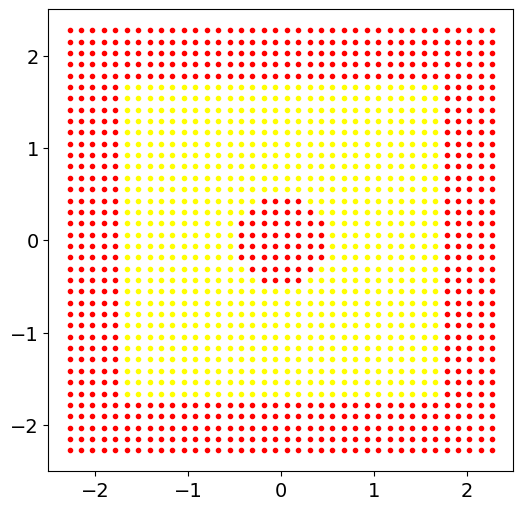

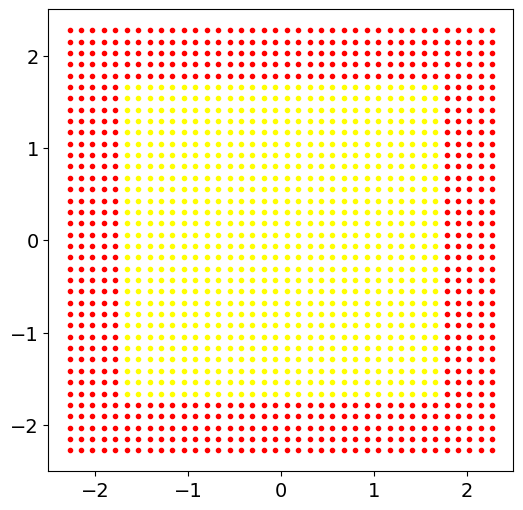

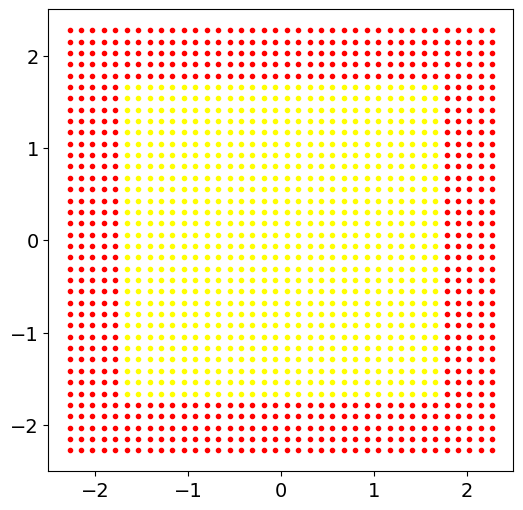

In [2]:
#########################
### Data Construction ###
#########################

width         = 3.5
density       = 72
unsafe_margin = 0.3
thn           = 24 #20

# make grid and obstacles
obs_funcs = []
grid, params, obs_dict, is_obs_grid = make_rectangle(height=width, width=width, density=density, unsafe_margin=unsafe_margin, center=(0,0), return_params=True)
#obs_dict = insert_shape(np.array([0,  1.5]), grid, obs_dict, shape='circle', scale=0.75, theta=0)
obs_dict, is_obs_circ = insert_shape(np.array([0, 0]), grid, obs_dict, shape='circle', scale=0.50, theta=0)
obstacles = np.array([pt for pt in grid if obs_dict[tuple(np.round(pt, 3))] != 0])
obs_funcs.append(is_obs_grid)
obs_funcs.append(is_obs_circ)

#### DEBUG: USE TO VALIDATE CHECK_OBS ###
'''
from data import check_obs
for pt in grid:
    if check_obs(pt, obs_funcs):
        plt.plot(pt[0], pt[1], marker='.', color="r", linestyle="none")
    else:
        plt.plot(pt[0], pt[1], marker='.', color="yellow", linestyle="none")
plt.show()
'''

# grids for centers and unsafe samples
c_grid, c_obs_dict = make_rectangle(height=width, width=width, density=density/1, unsafe_margin=unsafe_margin, center=(0,0))
s_grid, s_obs_dict = make_rectangle(height=width, width=width, density=density/1, unsafe_margin=unsafe_margin, center=(0,0))


# initialize hjb grid
lo, hi, n, spacing = params
print("x,y spacing:", spacing)
lo = lo + (0       ,)
hi = hi + (2*jnp.pi,)
n  = n  + (thn     ,)
print("theta spacing:", 2*jnp.pi / thn)

for i in range(len(lo)):
    print("X_" + str(i) + " GRID INFORMATION\n", 
          "domain: [", lo[i], ",", hi[i], "]\n", 
          "n:", n[i],"\n", 
          "density:", (hi[i]-lo[i])/n[i])


hjb_grid = hj.Grid.from_lattice_parameters_and_boundary_conditions(hj.sets.Box(lo, hi), n, periodic_dims=2)

plot_data(  grid,   obs_dict, size=6)
plot_data(c_grid, c_obs_dict, size=6)
plot_data(s_grid, s_obs_dict, size=6)

(1444, 2)
(38, 38, 24)


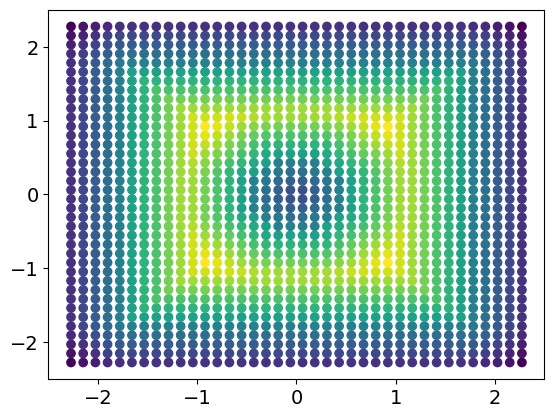

In [3]:
#####################################
### Make Signed Distance Function ###
#####################################

l = np.empty(hjb_grid.states.shape[:-1])

obs_coords = np.array([x for x in grid if obs_dict[tuple(np.round(x, 3))] != 0])
fre_coords = np.array([x for x in grid if obs_dict[tuple(np.round(x, 3))] == 0])

for i in range(n[0]):
    for j in range(n[1]):
        for k in range(n[2]):
            if obs_dict[tuple(np.round(np.array(hjb_grid.states[i, j, k, :-1]), 3))] != 0:
                l[i, j, k] = -np.min(np.linalg.norm(fre_coords - hjb_grid.states[i, j, k, :2], axis=1))
            else:
                l[i, j, k] =  np.min(np.linalg.norm(obs_coords - hjb_grid.states[i, j, k, :2], axis=1))

print(grid.shape)
print(l.shape)
plt.scatter(grid[:,0], grid[:,1], c=l[...,0].reshape(-1, 1))
plt.show()

In [4]:
############################
### Configure HJB Solver ###
############################

gamma  = 0.20
cbvf   = True
umax   = 0.40
utype  ="box"
V      = 0.10
l      = jnp.array(l)
values = l 
solver_settings = hj.SolverSettings.with_accuracy("very_high",
                                                  hamiltonian_postprocessor=hj.solver.backwards_reachable_tube,
                                                  value_postprocessor      =hj.solver.static_obstacle(l))

In [5]:
####################################
### Solver PDE for final surface ###
####################################

dynamics = hj.systems.Bicycle(gamma=gamma, V=V, umax=umax)
time = 0.
target_time = -500
target_values = hj.step(solver_settings, dynamics, hjb_grid, time, values, target_time)

100%|############################################################################################################################################| 500.0000/500.0 [00:04<00:00, 109.00sim_s/s]


<Figure size 640x480 with 0 Axes>

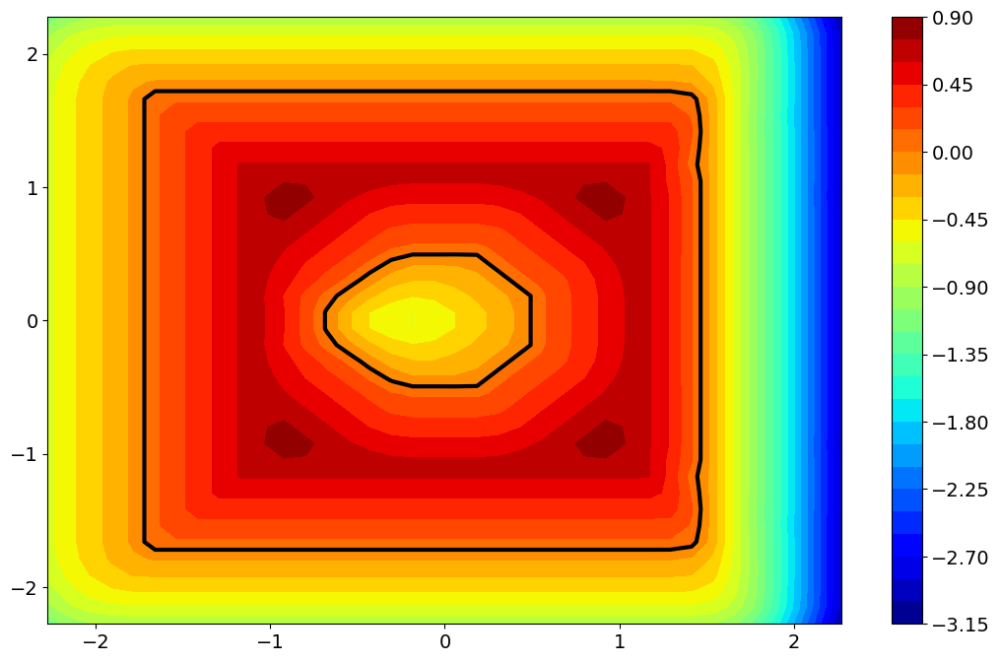

In [6]:
##########################
### Plot final surface ###
##########################

plt.jet()
plt.figure(figsize=(13, 8))
plt.contourf(hjb_grid.coordinate_vectors[0], hjb_grid.coordinate_vectors[1], target_values[:, :, 0].T, levels=30)
plt.colorbar()
plt.contour(hjb_grid.coordinate_vectors[0],
            hjb_grid.coordinate_vectors[1],
            target_values[:, :, 0].T,
            levels=0,
            colors="black",
            linewidths=3)

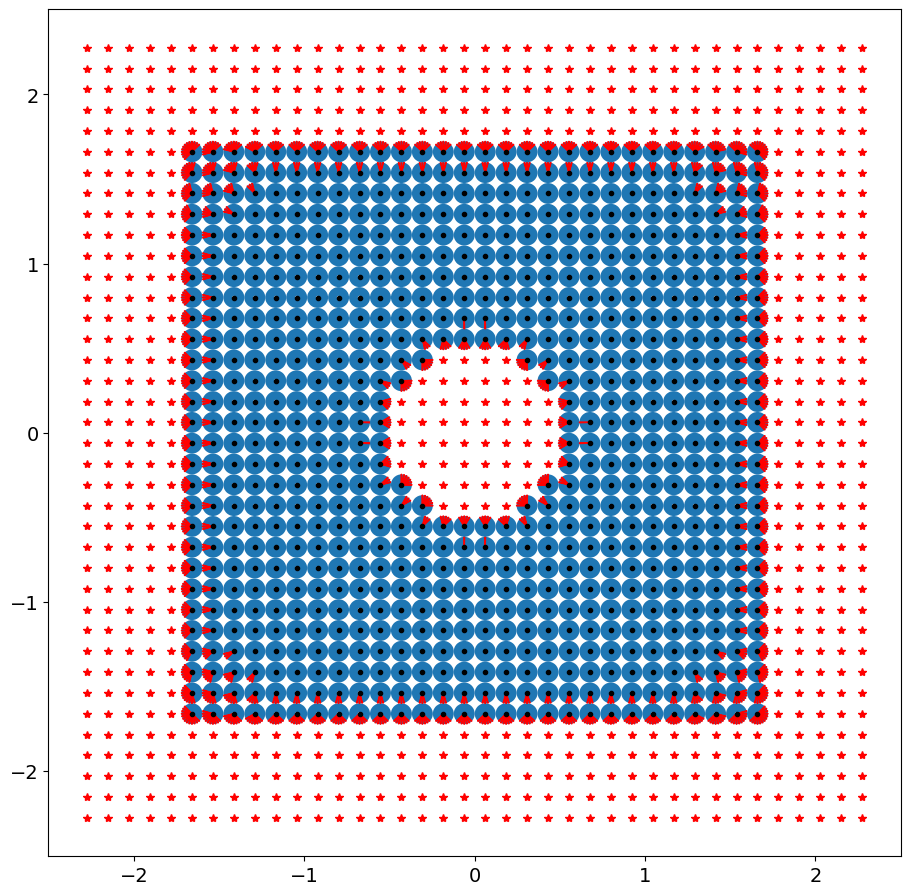

In [7]:
#######################################
### Plot V at each x,y using arrows ###
#######################################
ddegrees = 2

fig, ax = plt.subplots(figsize=(11,11))

plt.rc('xtick', labelsize=14)                                                
plt.rc('ytick', labelsize=14)                                                

for x in grid:                                                               
    if obs_dict[tuple(np.round(x, 3))] == 0:                               
        ax.plot(x[0], x[1], color="black", marker=".", linestyle="none")   
        A = pat.Annulus(x, spacing/2, spacing/2-0.01)
        ax.add_patch(A)
        pt = np.array([x[0], x[1], 0])
        idx = hjb_grid.nearest_index(pt)[:2]
        for i, Vtheta in enumerate(target_values[idx[0], idx[1]]):
            theta = hjb_grid.states[idx[0], idx[1], i][-1]
            if Vtheta <= 0:
                B = pat.Wedge(x, spacing/2, 360/(2*np.pi)*theta - ddegrees, 360/(2*np.pi)*theta + ddegrees, width=spacing/2, color='r')  
                ax.add_patch(B)
            #else:
            #    B = pat.Wedge(  x, s/2, 360/(2*np.pi)*theta - 1, 360/(2*np.pi)*theta + 1, width=s/2, color='b')  
            #    ax.add_patch(B)
    else:
        ax.plot(x[0], x[1], color="red"   , marker="*", linestyle="none") 

plt.show()

In [8]:
##############################
### Plot V(x, y, theta(t)) ###
##############################

vmin, vmax = target_values.min(), target_values.max()
levels = np.linspace(round(vmin), round(vmax), 5*(round(vmax) - round(vmin) + 1))
fig = plt.figure(figsize=(13, 8))

def render_frame(i, colorbar=False):
    plt.contourf(hjb_grid.coordinate_vectors[0],
                 hjb_grid.coordinate_vectors[1],
                 target_values[:, :, i].T,
                 vmin=vmin,
                 vmax=vmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.contour(hjb_grid.coordinate_vectors[0],
                hjb_grid.coordinate_vectors[1],
                target_values[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, target_values.shape[-1], interval=50).to_html5_video())
plt.close(); animation

In [9]:
##########################################
### Solve for backwards reachable tube ###
##########################################

times = np.linspace(0, -500, 100)
initial_values = l
all_values = hj.solve(solver_settings, dynamics, hjb_grid, times, initial_values)

100%|############################################################################################################################################| 500.0000/500.0 [00:04<00:00, 102.55sim_s/s]


In [10]:
##########################################
### Visualize backwards reachable tube ###
##########################################

vmin, vmax = all_values.min(), all_values.max()
levels = np.linspace(round(vmin), round(vmax), 15*(round(vmax) - round(vmin) + 1))
fig = plt.figure(figsize=(13, 8))

def render_frame(i, colorbar=False):
    plt.contourf(hjb_grid.coordinate_vectors[0],
                 hjb_grid.coordinate_vectors[1],
                 all_values[i, :, :, 10].T,
                 vmin=vmin,
                 vmax=vmax,
                 levels=levels)
    if colorbar:
        plt.colorbar()
    plt.contour(hjb_grid.coordinate_vectors[0],
                hjb_grid.coordinate_vectors[1],
                target_values[:, :, 10].T,
                levels=0,
                colors="black",
                linewidths=3)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, all_values.shape[0], interval=50).to_html5_video())
plt.close(); animation

In [29]:
###########################
### Agent Configuration ###
###########################

bf    = 31    # csrbf order
b     =-0.5 #-0.5 #-0.5   # offset (-0.5)
s     = 1.00#1.00  #0.75# csrbf zeroing
nm    = 0.20  # nm * n_safe = number of neighbors to consider
pct   = 0.40  # num neighber percentile under which boundary
mult  = 4
utype = utype # defined w/ hjb above
umax  = umax  # defined w/ hjb above
gamma = gamma # defined w/ hjb above
jax_f = True
solver        ='CLARABEL'
sensor_radius = 1.1
rx            = sensor_radius + 0.2 # sample radius
rc            = sensor_radius # radius around scan in which centers are chosen
init_x        =-1.1
init_y        =-1.1
init_theta    = 0

# CHECK GAMMA -> 1/GAMMA
a = Agent(dynamics, np.array([init_x, init_y, init_theta]), grid, obs_dict, width         = width, 
                                                                            sensor_radius = sensor_radius,
                                                                            bf            = bf, 
                                                                            b             = b, 
                                                                            s             = s,
                                                                            utype         = utype,
                                                                            umax          = umax,
                                                                            gamma         = gamma,
                                                                            jax_f         = jax_f,
                                                                            solver        = solver,
                                                                            spacing       = spacing,
                                                                            obstacles     = obstacles)

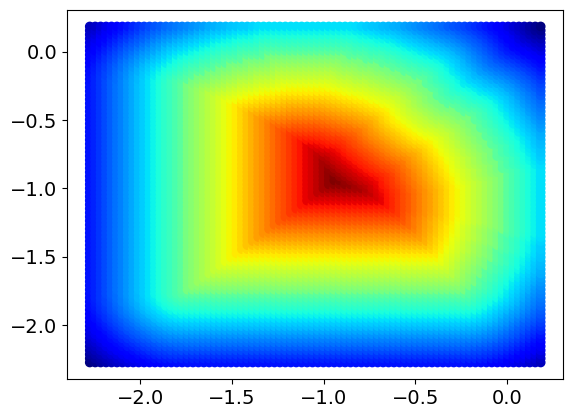

100%|#############################################################################################################################################| 500.0000/500.0 [00:39<00:00, 12.80sim_s/s]


<Figure size 640x480 with 0 Axes>

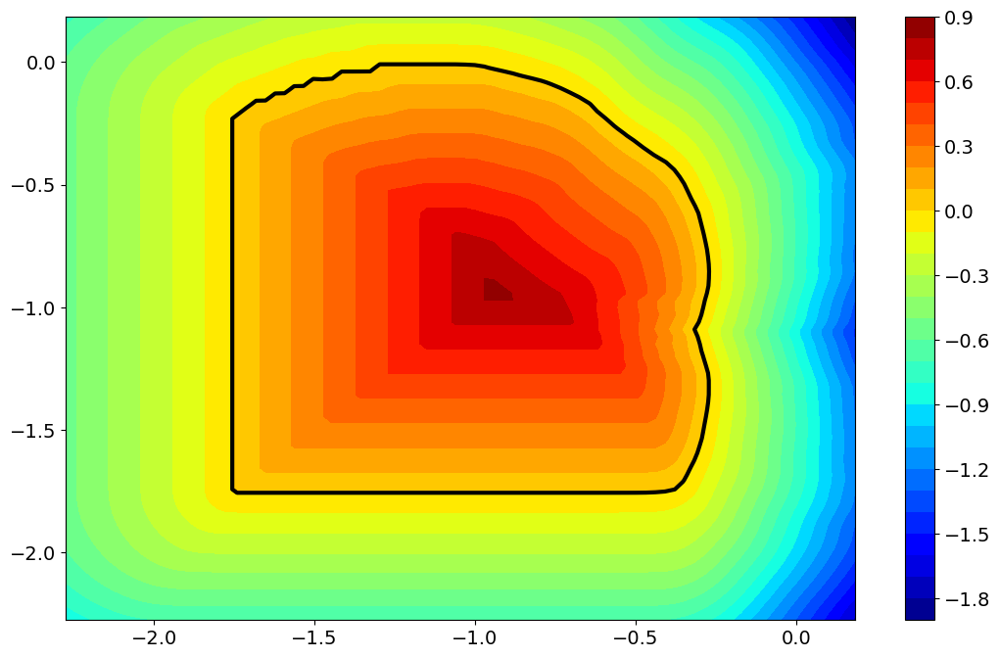

In [30]:
####################
### Initial scan ###
####################

# scan states 
pts_safe, pts_unsafe,\
             in_scan_f = a.scan(ret_in_scan_f=True) 
scan_funcs = [in_scan_f]
samples, gparams,\
is_obs_sample, x2pi_samp, x0_samp = a.sample(rx, grid=s_grid, hjb_grid=hjb_grid, hjb=True, bicycle=True, boundary_condition=True)
sample_funcs = [is_obs_sample]
loc_V, loc_hjb_grid    = a.get_local_V(gparams, obs_funcs + [is_obs_sample], thn, rx=rx, T=500, mult=mult)

In [31]:
vmin, vmax = loc_V.min(), loc_V.max()
#levels = np.linspace(round(vmin), round(vmax), 10*(round(vmax) - round(vmin) + 1))
levels = np.linspace(vmin, vmax, 10*(round(vmax) - round(vmin) + 1))
fig    = plt.figure(figsize=(13, 8))
def render_frame(i, colorbar=False):
    plt.contourf(loc_hjb_grid.coordinate_vectors[0],
                 loc_hjb_grid.coordinate_vectors[1],
                 loc_V[:, :, i].T,
                 vmin=vmin,
                 vmax=vmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.contour(loc_hjb_grid.coordinate_vectors[0],
                loc_hjb_grid.coordinate_vectors[1],
                loc_V[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, loc_V.shape[-1], interval=50).to_html5_video())
plt.close()
animation

In [32]:
scan_safe, scan_unsafe,\
x2pi_scan, x0_scan = a.scan_hjb(loc_V, loc_hjb_grid, bicycle=True, boundary_condition=True)
n_safe             = len(scan_safe) #len(pts_safe)
x_buffer, x_safe   = a.make_buffer(scan_safe, int(nm * n_safe), pct, bicycle=True)

x2pi = np.vstack((x2pi_samp, x2pi_scan))
x0   = np.vstack((x0_samp, x0_scan))

# unsafe states 
if scan_unsafe.shape[0] != 0:
    x_unsafe = np.vstack((scan_unsafe, samples))
else: 
    x_unsafe = samples    

counts [408 405 408 ... 489 464 443]
pct 0.4


In [33]:
#######################
### Collect centers ###
#######################

C = []
for x in c_grid:
    if np.linalg.norm(x[:2] - a.pos[:2]) <= rc:
        C.append(x)
C = np.array(C)

tmp = []
for p in C:
    c = np.repeat(p.reshape(1, -1), hjb_grid.states.shape[2], axis=0)
    c = np.hstack((c, np.array(hjb_grid.coordinate_vectors[2]).reshape(-1, 1)))
    cend = np.array([p[0], p[1], 2*np.pi]).astype(np.float32)
    tmp.append(np.vstack((c,cend)))
C = np.vstack(tmp) 

a.centers.append(C)

dx = params[-1]
dth = abs(loc_hjb_grid.states[0,0,0,2]-hjb_grid.states[0,0,1,2])
print("ratio of subsequent theta gridpt dist to csrbf zeroing dist:\n",s/dth)
print("ratio of subsequent x gridpt dist to csrbf zeroing dist:\n",s/dx)
for i in range(2):
    print("X_" + str(i) + " GRID INFORMATION\n", 
          "domain: [", loc_hjb_grid.domain.lo[i], ",", loc_hjb_grid.domain.hi[i], "]\n", 
          "n:", (loc_hjb_grid.domain.hi[i] - loc_hjb_grid.domain.lo[i]) / spacing,"\n", 
          "density:", hjb_grid.states.shape[i]/(hjb_grid.domain.hi[i]-hjb_grid.domain.lo[i]))
print("X_" + str(2) + " GRID INFORMATION\n", 
      "domain: [", hjb_grid.domain.lo[2], ",", hjb_grid.domain.hi[2], "]\n", 
      "n:", (hjb_grid.domain.hi[2] - hjb_grid.domain.lo[2]) / spacing,"\n", 
      "density:", hjb_grid.states.shape[2]/(hjb_grid.domain.hi[2]-hjb_grid.domain.lo[2]))

sth = s/dx * dth
print("theta zeroing dist should be:", sth)
print("ratio of subsequent theta gridpt dist to modified csrbf zeroing dist:\n",sth/dth)
theta_scale = (n[2] * (hi[0] - lo[0])) / (n[0] * 2*np.pi)
print(theta_scale)
a.theta_scale = theta_scale / 1
print(a.theta_scale)
#1 / 2*np.pi 

#from optim import get_phiT
#phi = get_phiT(a)
#phi(np.array([0, 0, 0]), C)

ratio of subsequent theta gridpt dist to csrbf zeroing dist:
 3.8197186
ratio of subsequent x gridpt dist to csrbf zeroing dist:
 8.131868131868133
X_0 GRID INFORMATION
 domain: [ -2.275 , 0.18445946 ]
 n: 20.0 
 density: 8.351648351648352
X_1 GRID INFORMATION
 domain: [ -2.275 , 0.18445946 ]
 n: 20.0 
 density: 8.351648351648352
X_2 GRID INFORMATION
 domain: [ 0 , 6.283185307179586 ]
 n: 51.09403436607576 
 density: 3.819718634205488
theta zeroing dist should be: 2.1289182
ratio of subsequent theta gridpt dist to modified csrbf zeroing dist:
 8.131868
0.457361046990394
0.457361046990394


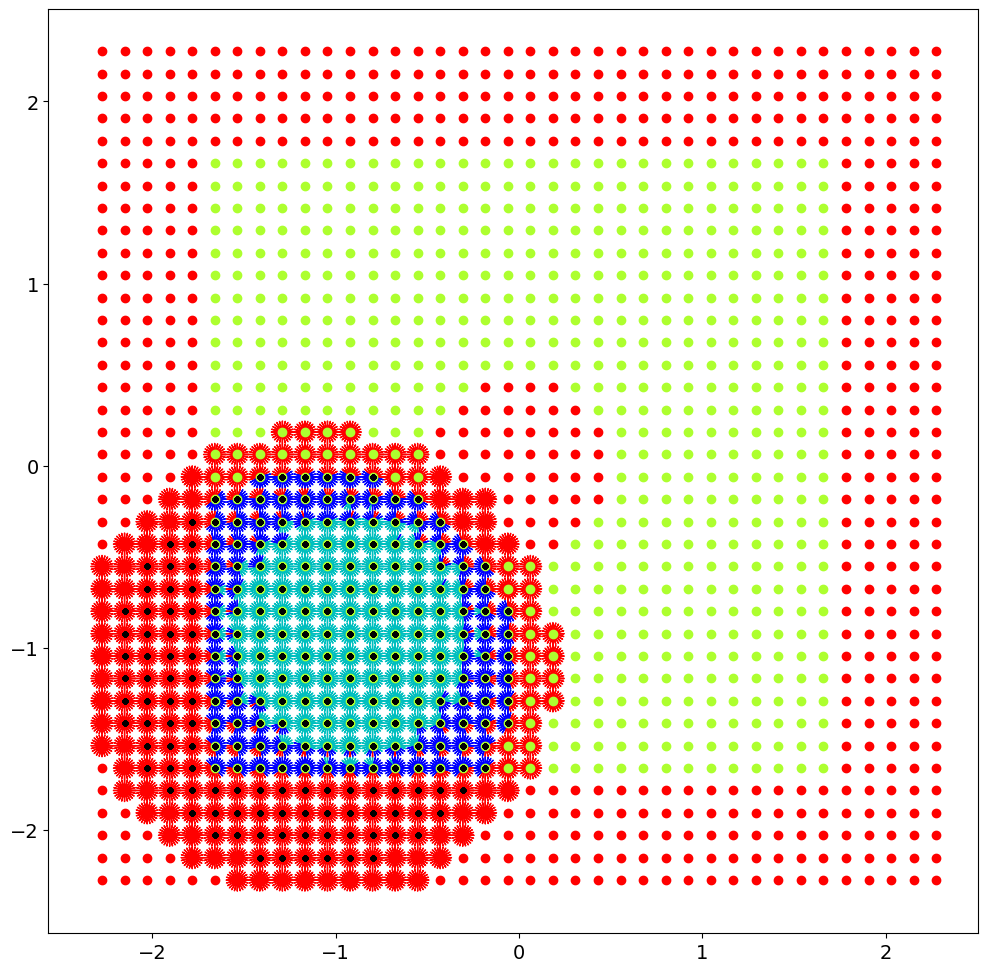

In [34]:
#############################
### Plot Initial CBF data ###
#############################

plot_angle_data(C, grid, obs_dict, spacing, safe=x_safe, buffer=x_buffer, unsafe=scan_unsafe, samples=samples)

In [35]:
###########################################
### Obtain controls from Value Function ###
###########################################

from tqdm import tqdm

u_safe = hjb_controls_parallel(a, x_safe, loc_hjb_grid, loc_V, verbose=True)
if x_buffer.shape[0] != 0:
    u_buffer = hjb_controls_parallel(a, x_buffer, loc_hjb_grid, loc_V)
else:
    u_buffer = np.array([]) 

'''
u_buffer = []
for x in tqdm(x_buffer):
    u_buffer.append(hjb_controls(a, x, loc_hjb_grid, loc_V))
u_buffer = np.array(u_buffer)

u_safe = []
for x in tqdm(x_safe):
    u_safe.append(hjb_controls(a, x, loc_hjb_grid, loc_V))
u_safe = np.array(u_safe)
'''

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Aug 28 01:48:13 PM: Your problem has 2292 variables, 1 constraints, and 0 parameters.
(CVXPY) Aug 28 01:48:13 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Aug 28 01:48:13 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Aug 28 01:48:13 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Aug 28 01:48:13 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Aug 28 01:48:13 PM: Compiling problem (target solver=CLARABEL)

'\nu_buffer = []\nfor x in tqdm(x_buffer):\n    u_buffer.append(hjb_controls(a, x, loc_hjb_grid, loc_V))\nu_buffer = np.array(u_buffer)\n\nu_safe = []\nfor x in tqdm(x_safe):\n    u_safe.append(hjb_controls(a, x, loc_hjb_grid, loc_V))\nu_safe = np.array(u_safe)\n'

In [36]:
##############################
### Initial CBF Parameters ###
##############################
    
gamma_safe   = 0.3#0.3
gamma_unsafe =-0.3#-0.3
gamma_dyn    = 0.01#0.1
lam_safe     = 1
lam_dyn      = 0.1
lam_unsafe   = 1
lam_dh       = 1e-4#0.0
lam_th       = 0.0
lam_sp       = 0

In [37]:

print(loc_hjb_grid.states.shape)
print(loc_V.shape)
print(loc_hjb_grid.interpolate(loc_V, C[0]))




(84, 84, 24, 3)
(84, 84, 24)
-0.41040382


[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473
it 50 loss: 7.9898863
it 60 loss: 7.141364
it 70 loss: 6.608191
it 80 loss: 6.342764
it 90 loss: 6.185544


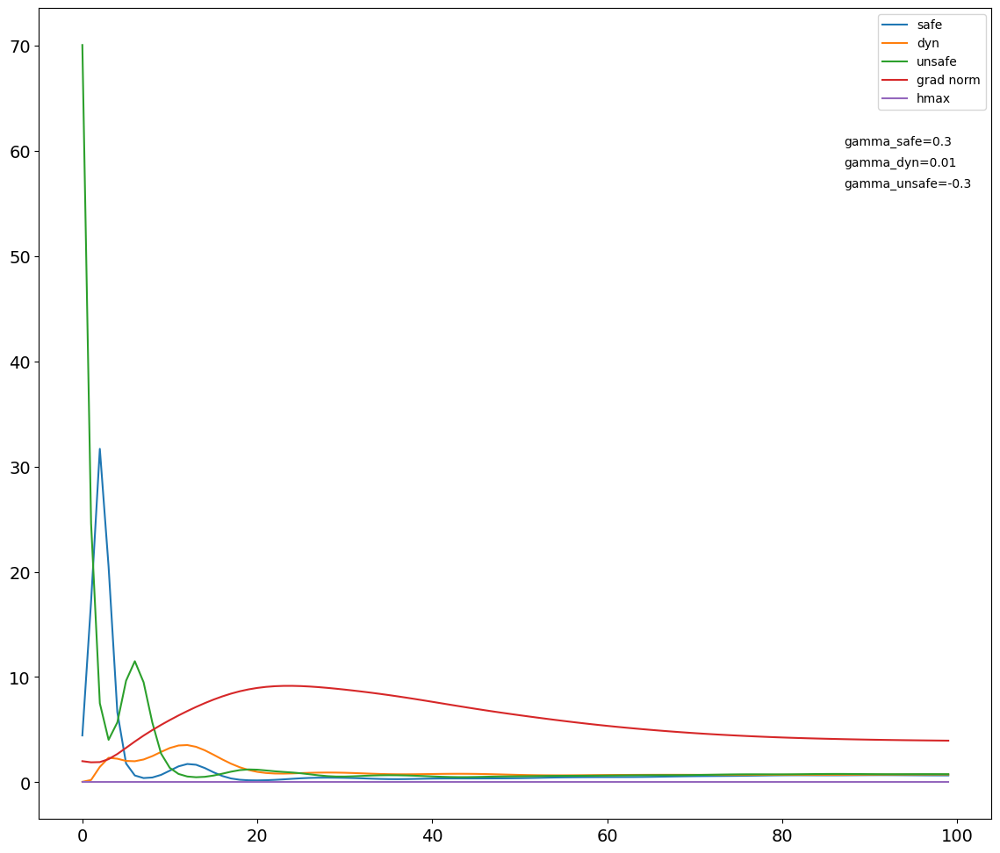

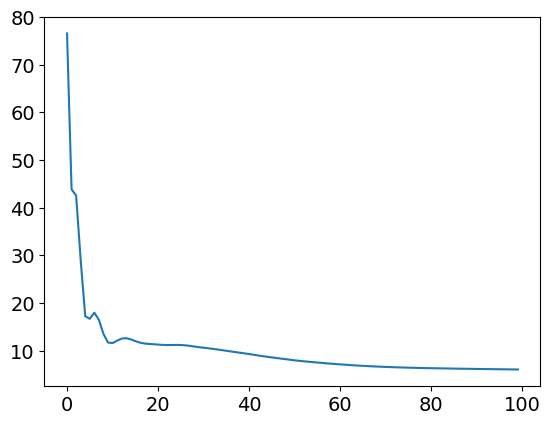

position is [-1.1 -1.1  0. ]
start time is 0


  9%|█████████████▎                                                                                                                                        | 142/1600 [00:15<01:52, 13.01it/s]

val [0.4       0.0142848] max 0.4
val [0.4        0.02212025] max 0.4
val [0.4        0.02976884] max 0.4


  9%|█████████████▌                                                                                                                                        | 144/1600 [00:15<01:53, 12.81it/s]

val [0.4        0.03681005] max 0.4
val [0.4        0.04286508] max 0.4
val [0.4        0.04759749] max 0.4


  9%|█████████████▉                                                                                                                                        | 148/1600 [00:15<01:52, 12.89it/s]

val [0.4        0.05071091] max 0.4
val [0.4        0.05194062] max 0.4
val [0.4        0.05107964] max 0.4


  9%|██████████████                                                                                                                                        | 150/1600 [00:15<01:53, 12.75it/s]

val [0.4        0.04809424] max 0.4
val [0.4        0.04340308] max 0.4
val [0.4        0.03808365] max 0.4


 10%|██████████████▍                                                                                                                                       | 154/1600 [00:16<01:52, 12.80it/s]

val [0.4        0.03321654] max 0.4
val [0.4        0.02925177] max 0.4
val [0.4        0.02622449] max 0.4


 10%|██████████████▋                                                                                                                                       | 156/1600 [00:16<01:53, 12.73it/s]

val [0.4        0.02405578] max 0.4
val [0.4       0.0226413] max 0.4
val [0.4        0.02186882] max 0.4


 10%|███████████████                                                                                                                                       | 160/1600 [00:16<01:53, 12.65it/s]

val [0.4        0.02160028] max 0.4
val [0.4        0.02165857] max 0.4
val [0.4        0.02180827] max 0.4


 10%|███████████████▏                                                                                                                                      | 162/1600 [00:16<01:53, 12.67it/s]

val [0.4        0.02177368] max 0.4
val [0.4        0.02128544] max 0.4
val [0.4        0.02013584] max 0.4


 10%|███████████████▌                                                                                                                                      | 166/1600 [00:17<01:54, 12.54it/s]

val [0.4       0.0181778] max 0.4


 48%|████████████████████████████████████████████████████████████████████████                                                                              | 768/1600 [01:15<01:05, 12.77it/s]

val [0.4       0.0006037] max 0.4


 63%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 1012/1600 [01:36<00:45, 12.94it/s]

val [0.4        0.00125783] max 0.4


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1576/1600 [02:29<00:01, 13.14it/s]

val [0.4       0.0014754] max 0.4


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1600/1600 [02:30<00:00, 10.61it/s]


### PLOTTING h(x(t)) ###


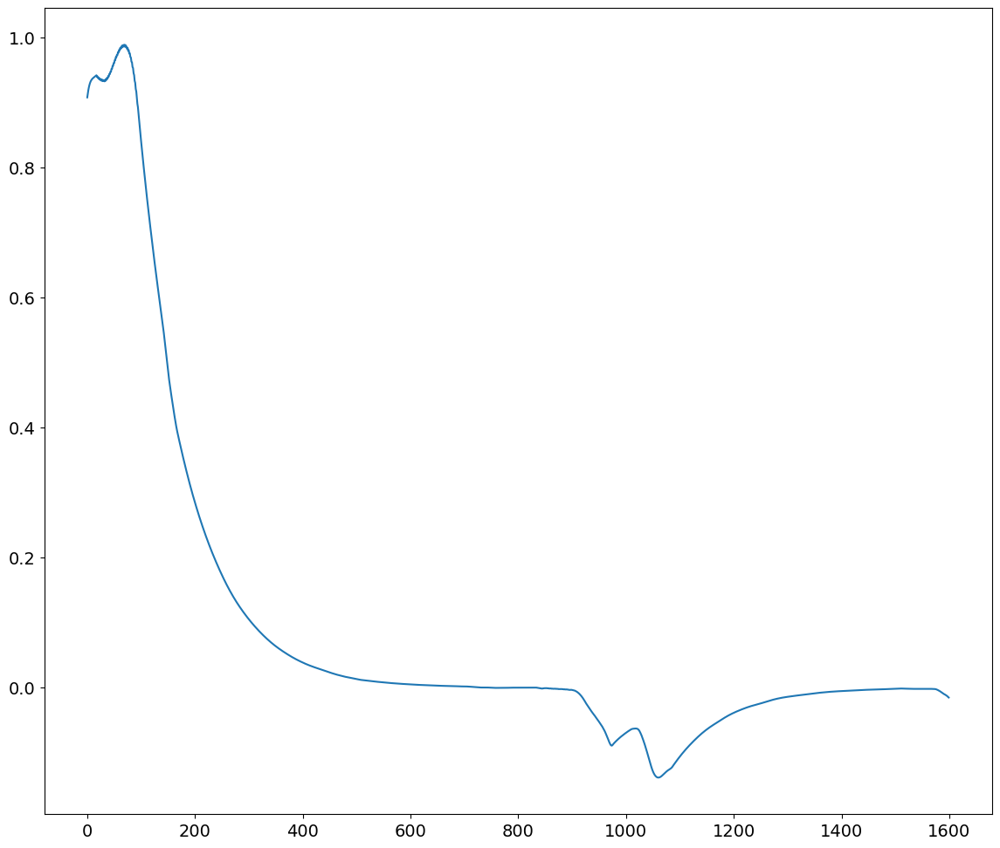

### PLOTTING CONTROL SIGNAL ###


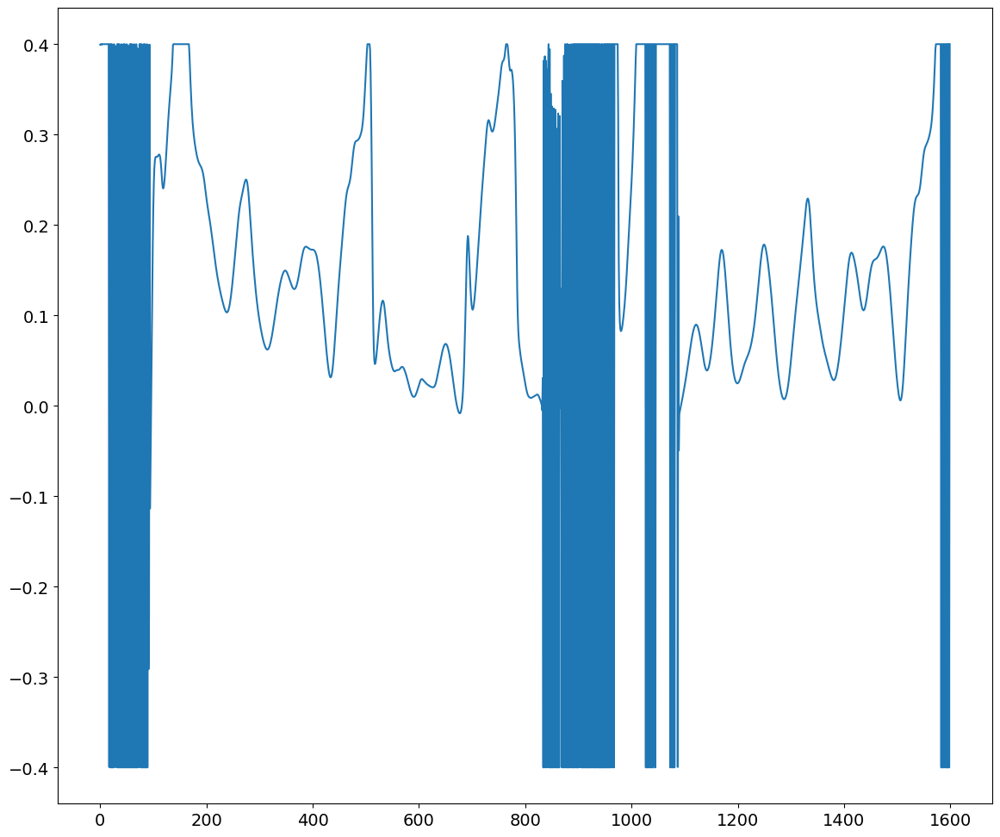

### PLOTTING CBF AND TRAJECTORY ###
num data 5400000
partition 90000
remainder 0


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 60/61 [13:44<00:13, 13.74s/it]


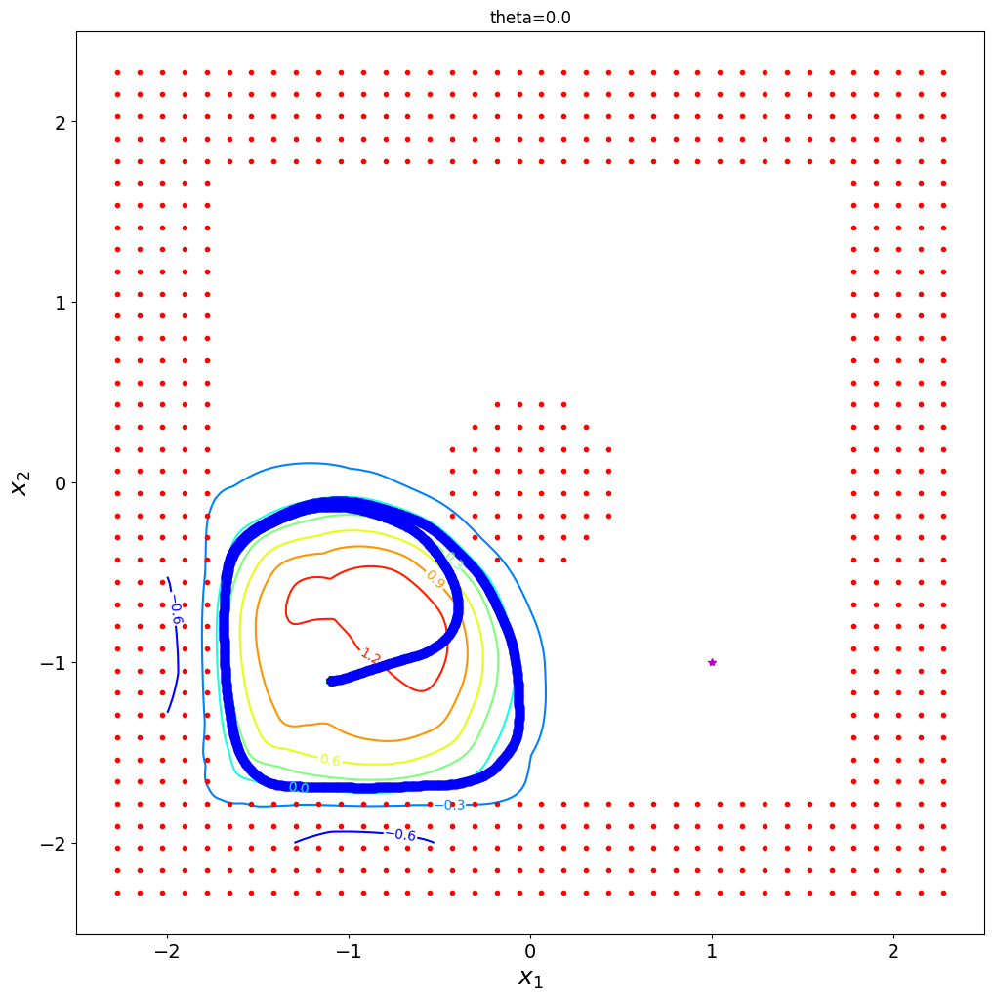

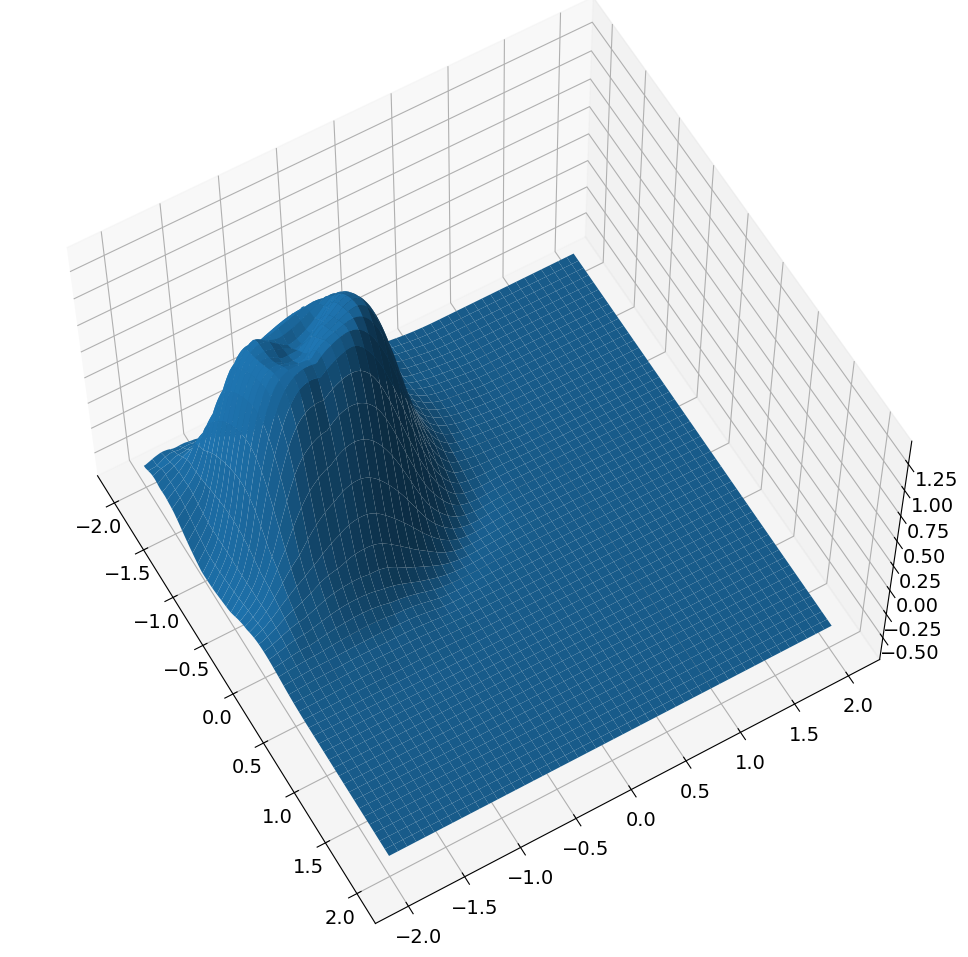

max h 1.4216659
percent violation: 0.133125
new position is [-1.68178916 -0.54097766 10.8105793 ]
new time is 80


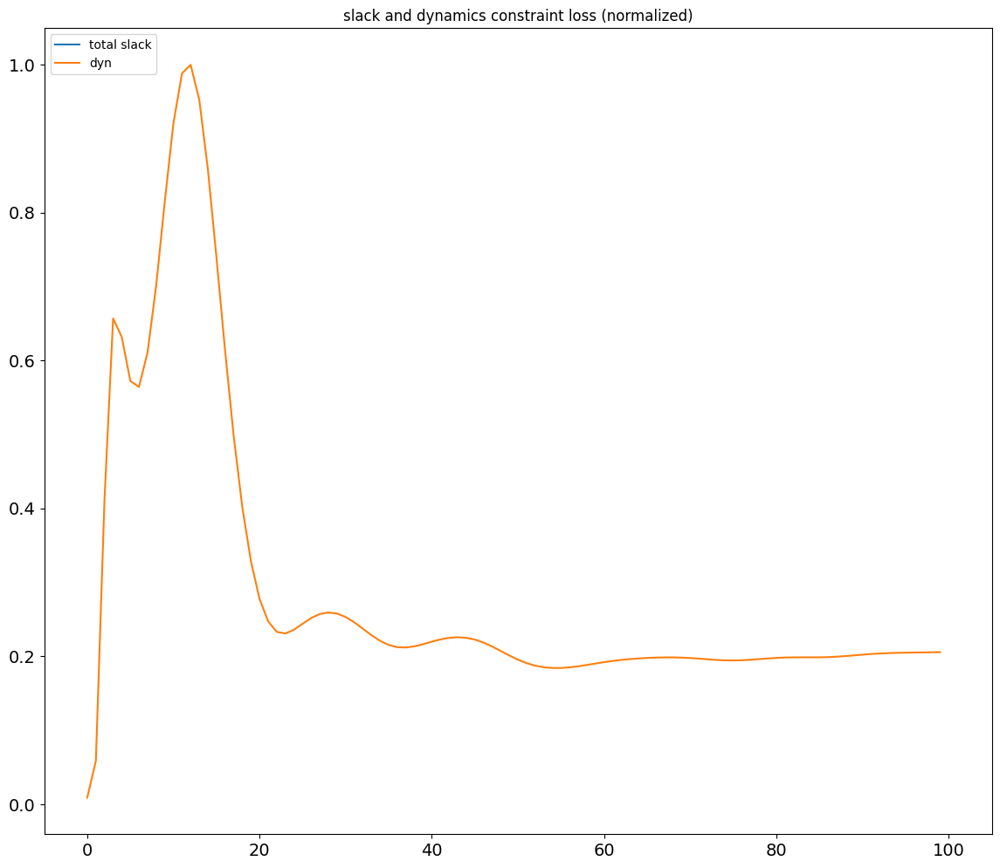

centers shape before:
(6400, 3)


In [38]:
#########################
### Solve Initial CBF ###
#########################

# get h as a function of agent parameter
h = get_h(a)

#print(x2pi)
#print(x0)
#L = get_learning_cbfs_lagrangian_hj_optim(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh, gamma_safe, gamma_dyn, gamma_unsafe)
#theta, _, _ = scipy.optimize.fmin_l_bfgs_b(L, np.random.rand(C.shape[0], 1), approx_grad=False, iprint=50)
#theta = cvx_train_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe, lam_dh=lam_dh, lam_sp=lam_sp, verbose=True)
#theta = np.array(clarabel_solve_cbf(a, x_safe.astype(np.float64), u_safe.astype(np.float64), x_buffer.astype(np.float64), 
#                                       u_buffer.astype(np.float64), x_unsafe.astype(np.float64), gamma_safe, gamma_dyn, gamma_unsafe))#,
#                                       x2pi=x2pi.astype(np.float64), x0=x0.astype(np.float64) ))
# prepare data 
#theta = np.array(clarabel_solve_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe))
#C = loc_hjb_grid.states.reshape(-1, 3)

init_pos = np.array([init_x, init_y, init_theta])
a.pos = init_pos
target = np.array([1, -1, 0])
slack = []
IT = [100]
for it in IT:
    a.centers = [C]
    interpv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
    rhs = interpv(loc_V, C)
    theta = fit_cbf_w_inv(a, C, rhs)
    #h_max = plot_cbf(a, C[np.newaxis,...], theta[np.newaxis,...], angle=a.pos[-1], obstacles=obstacles, N_part=60)
    print(theta)
    #it = 5; 
    eps=3e-2; tol=1e-8; mu=0.90; hm=10 #mu = 0.90 #170e-10
    theta, loss, Lsafe, Ldyn, Lunsafe = gradient_descent(a, theta, it, eps, mu, tol, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe,\
                                        gamma_dyn, gamma_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh, lam_th, hm, use_jax=True)
    plt.plot(loss)
    plt.show()
    a.thetas = [theta]
 
    # GET TOTAL SLACK #
    DT   = 0.05    # numerical integration timestep
    htol  = None # h-value at which to halt approach
    eps  = 0.00     #0.001
    dx   = 0.5     # if |x'-x|<dx, approach again
    tend = 80      # Duration of boundary approach
    T    = 0.3     # MPC horizon (default timestep is 0.05)
    N    = 3       # number of CBFs to learn
    a.pos = init_pos#np.array([init_x, init_y, init_theta])
    traj,usig,total_slack = a.goto(target, T=T, tend=tend, tol=htol, angle=a.pos[-1], manual=True, DT=DT, eps=eps, N_part=60, 
                                   plot_usig=True, plot_hxt=True, plot_max_cbf=True)
    slack.append(total_slack)


plt.figure(figsize=(14,12))
IT = np.array(IT)
slack = np.array(slack)
slack = slack / np.max(slack)
Ldyn = np.array(Ldyn)
Ldyn = Ldyn / np.max(Ldyn)
plt.plot(IT, slack, label="total slack")
#plt.plot(Lsafe, label="safe")
plt.plot(Ldyn, label="dyn")
#plt.plot(Lunsafe, label="unsafe")
plt.legend()
plt.title("slack and dynamics constraint loss (normalized)")
#plt.ylim(0, 100)
plt.show()



#a.thetas.append(theta)
a.rectify_c_and_theta()

# initialize plotting objects
init_pos       = init_pos #np.copy(a.pos)
curr_centers   = np.copy(np.array(a.centers))
curr_thetas    = np.copy(np.array(a.thetas))
curr_data      = np.copy(np.vstack((x_safe, x_buffer, x_unsafe)))
curr_traj      = init_pos.reshape(-1, 3)#np.copy(a.pos.reshape(-1, 3))
quad_plot_args =[(0, curr_centers, curr_thetas, curr_data)]
data_safe = np.vstack((x_buffer, x_safe))
data_unsafe = x_unsafe
all_C = C

In [21]:
print(np.array(a.centers).shape)
print(theta.shape)
print(np.array(a.thetas).shape)
print(np.linalg.norm(theta)**2)

(1, 6400, 3)
(6400,)
(1, 6400)
3576194.942437172


### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 9000
remainder 0


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 10/11 [00:15<00:01,  1.58s/it]


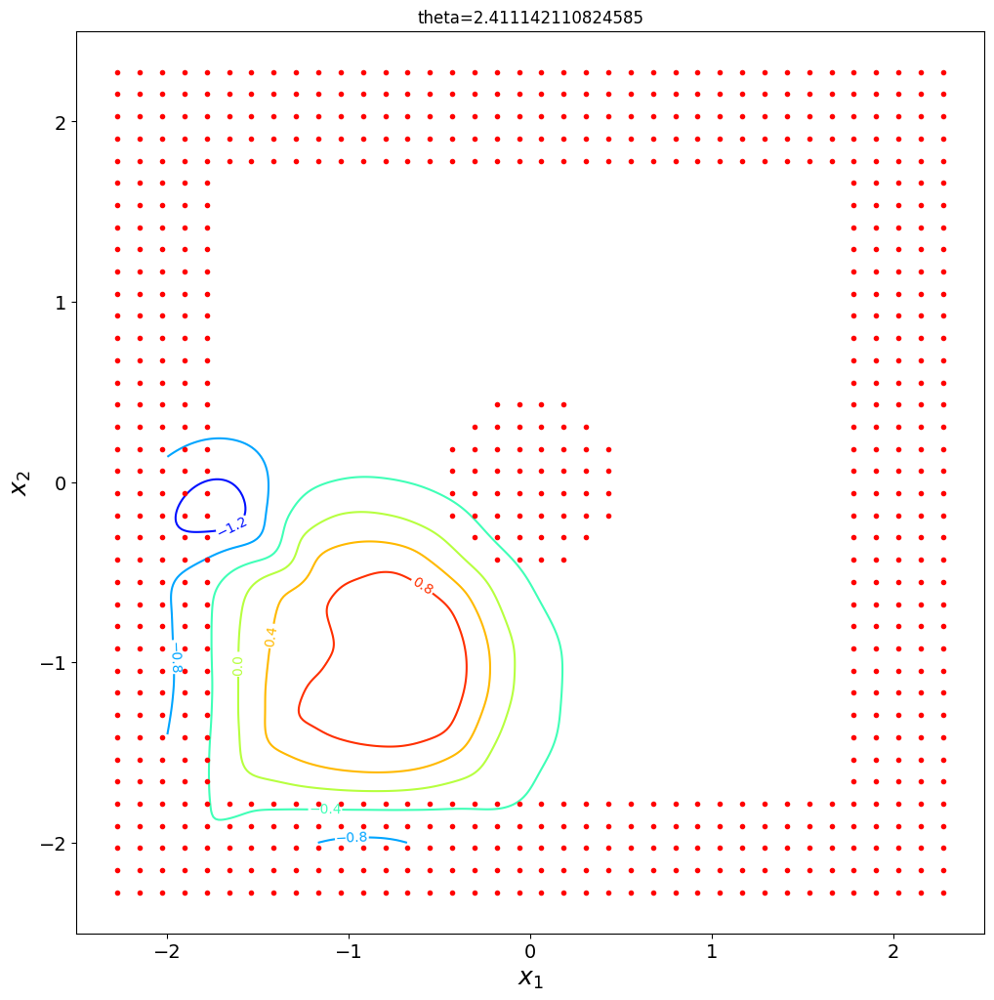

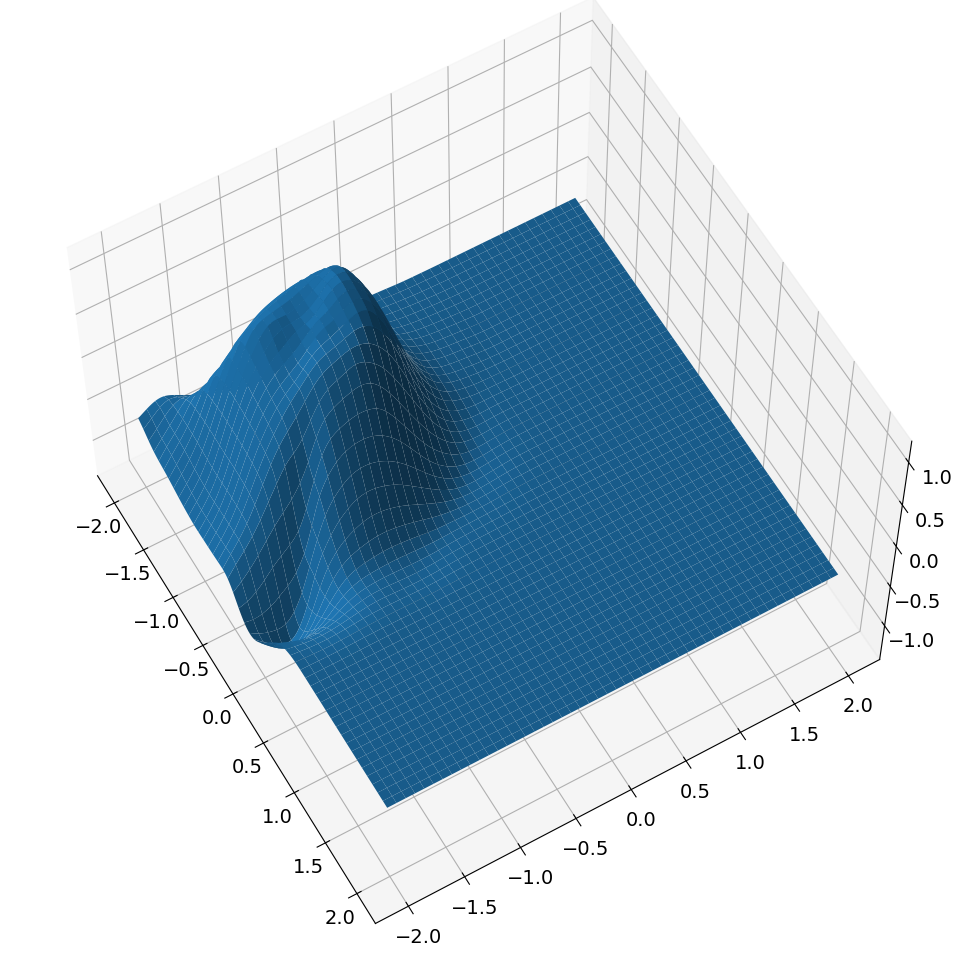

max h 1.1893741
num data 34656
partition 3465
remainder 6
(3465, 3)
(3465, 3)
(3465, 3)
(3465, 3)
(3465, 3)
(3465, 3)
(3465, 3)
(3465, 3)
(3465, 3)
(3465, 3)
(6, 3)


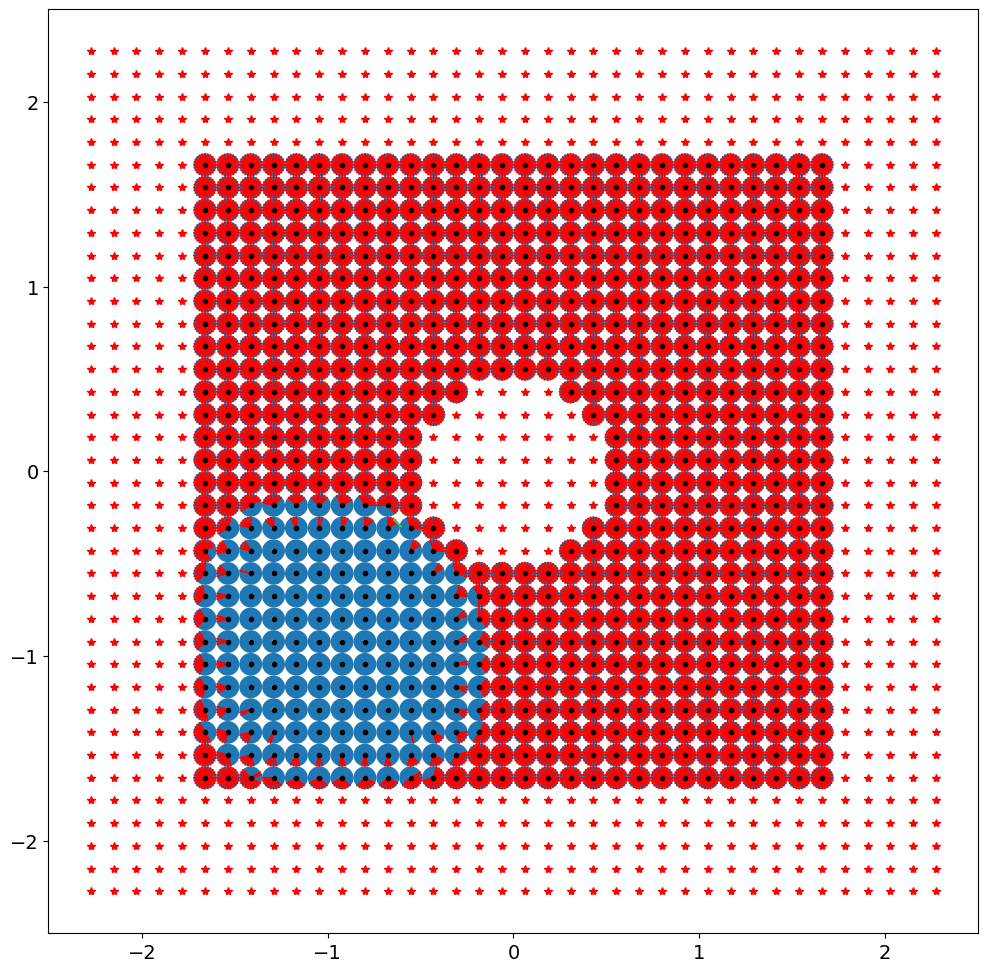

In [22]:
########################
### Plot Initial CBF ###
########################

h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles, N_part=10)
#a.thetas[-1] *= 1 / h_max
#h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles, N_part=10)
#h_max = plot_cbf(a, loc_hjb_grid.states.reshape(-1, 3)[np.newaxis,:], theta[np.newaxis, :], angle=a.pos[-1], obstacles=obstacles)
#h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=2*np.pi, obstacles=obstacles)
plot_angles(a, grid, loc_hjb_grid, obs_dict, pos=a.pos, N_part=10)

In [23]:
##################################
### Configure Safe Exploration ###
##################################

DT   = 0.05   # numerical integration timestep
htol = gamma_safe/2   # h-value at which to halt approach
eps  = 0.000
dx   = 0.5     # if |x'-x|<dx, approach again
tend = 80      # Duration of boundary approach
T    = 0.3     # MPC horizon (default timestep is 0.05)
N    = 3       # number of CBFs to learn
it   = 100

target: [ 1 -1  0]
position is [-1.1 -1.1  0. ]
start time is 80


  9%|█████████████▎                                                                                                                                        | 142/1600 [00:13<01:56, 12.55it/s]

val [0.4       0.0142848] max 0.4
val [0.4        0.02212025] max 0.4
val [0.4        0.02976884] max 0.4


  9%|█████████████▌                                                                                                                                        | 144/1600 [00:14<01:55, 12.66it/s]

val [0.4        0.03681005] max 0.4
val [0.4        0.04286508] max 0.4
val [0.4        0.04759749] max 0.4


  9%|█████████████▉                                                                                                                                        | 148/1600 [00:14<01:52, 12.92it/s]

val [0.4        0.05071091] max 0.4
val [0.4        0.05194062] max 0.4
val [0.4        0.05107964] max 0.4
val [0.4        0.04809424] max 0.4


 10%|██████████████▎                                                                                                                                       | 152/1600 [00:14<02:31,  9.57it/s]

val [0.4        0.04340308] max 0.4
val [0.4        0.03808365] max 0.4
val [0.4        0.03321654] max 0.4


 10%|██████████████▍                                                                                                                                       | 154/1600 [00:15<02:19, 10.36it/s]

val [0.4        0.02925177] max 0.4
val [0.4        0.02622449] max 0.4
val [0.4        0.02405578] max 0.4


 10%|██████████████▊                                                                                                                                       | 158/1600 [00:15<02:03, 11.65it/s]

val [0.4       0.0226413] max 0.4
val [0.4        0.02186882] max 0.4
val [0.4        0.02160028] max 0.4


 10%|███████████████                                                                                                                                       | 160/1600 [00:15<01:59, 12.04it/s]

val [0.4        0.02165857] max 0.4
val [0.4        0.02180827] max 0.4
val [0.4        0.02177368] max 0.4


 10%|███████████████▎                                                                                                                                      | 164/1600 [00:15<01:53, 12.61it/s]

val [0.4        0.02128544] max 0.4
val [0.4        0.02013584] max 0.4
val [0.4       0.0181778] max 0.4


 17%|████████████████████████▊                                                                                                                             | 265/1600 [00:24<02:05, 10.66it/s]

### PLOTTING h(x(t)) ###


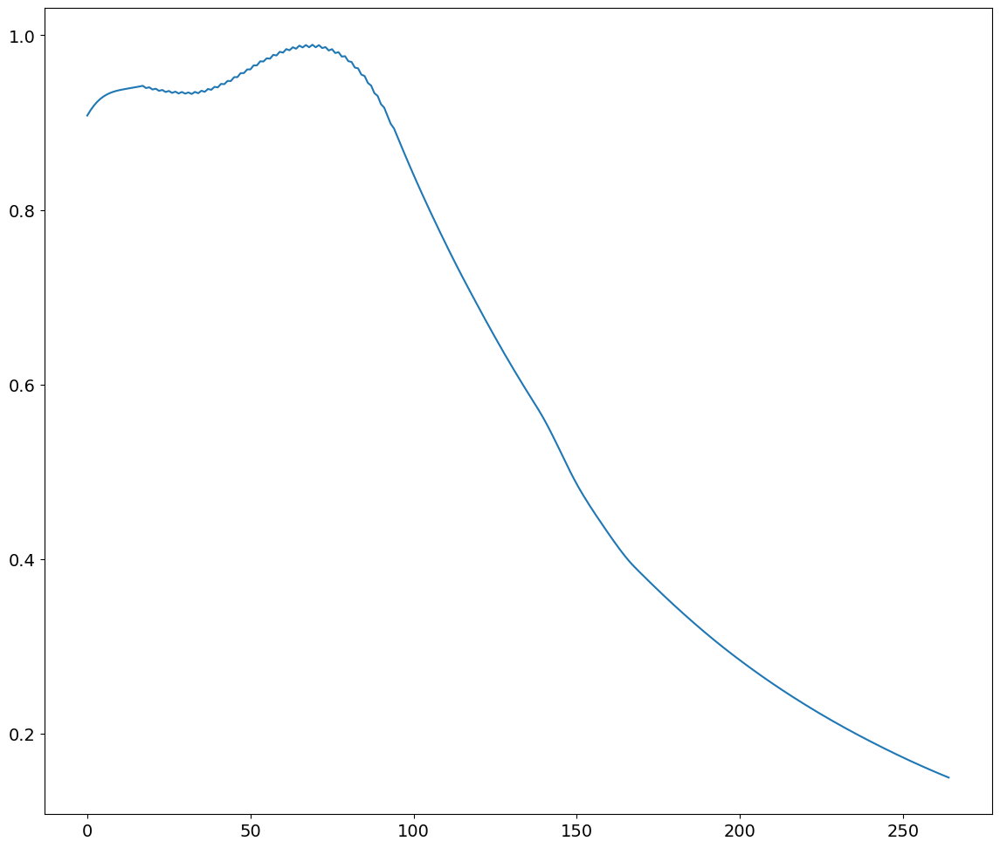

### PLOTTING CONTROL SIGNAL ###


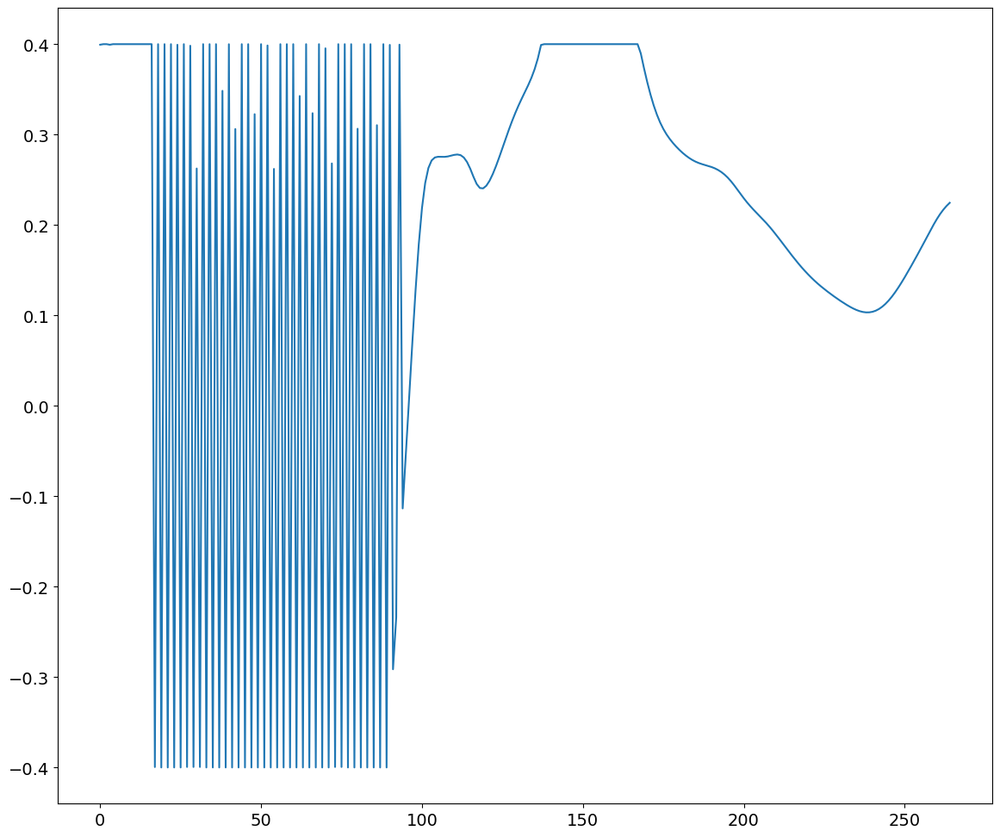

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 60/61 [00:18<00:00,  3.26it/s]


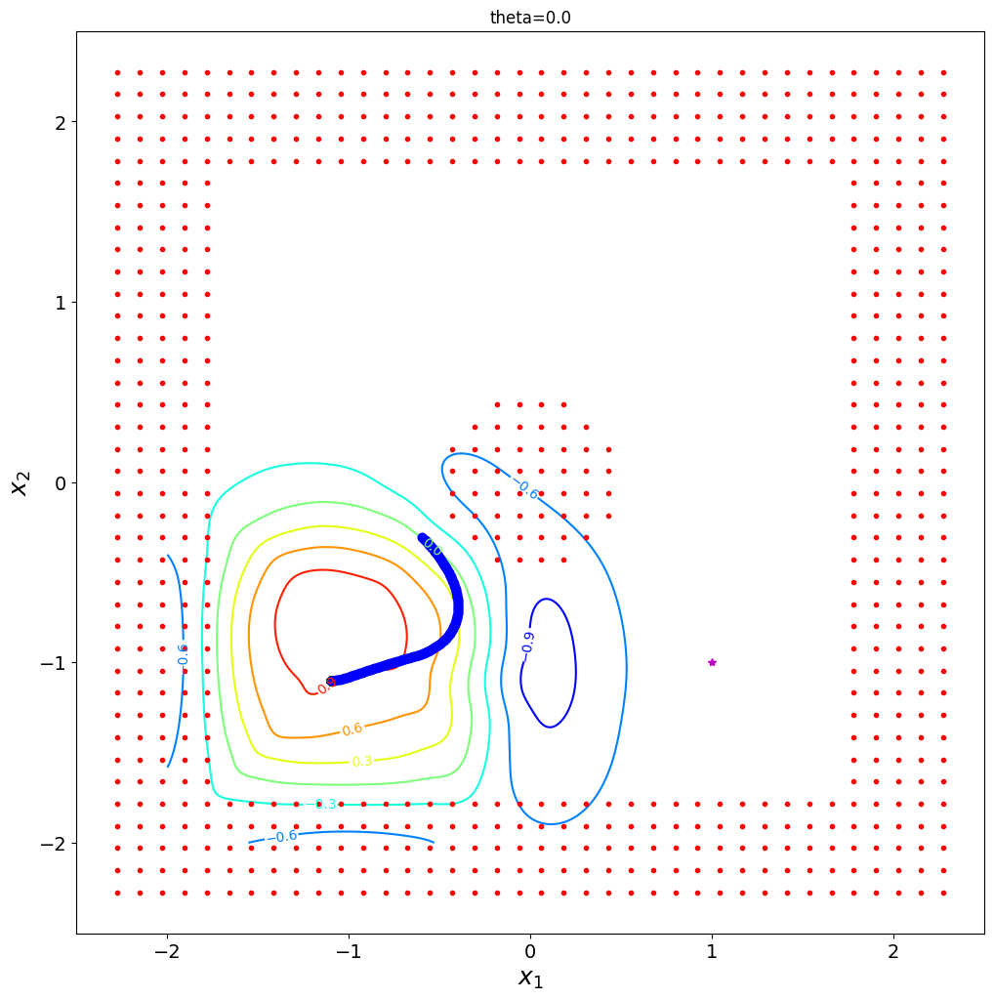

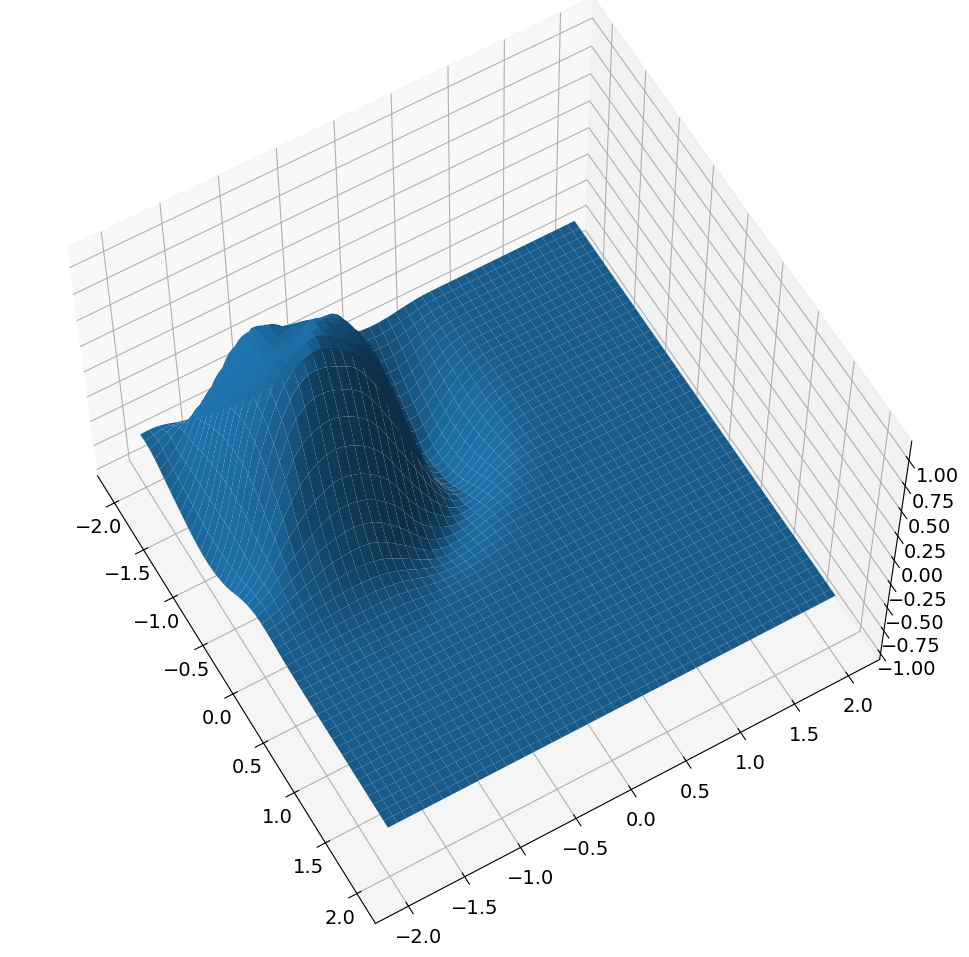

max h 1.1388469
percent violation: 0.01875
new position is [-0.59954333 -0.30300114  2.41114211]
new time is 160
dx: 2.588294871910319


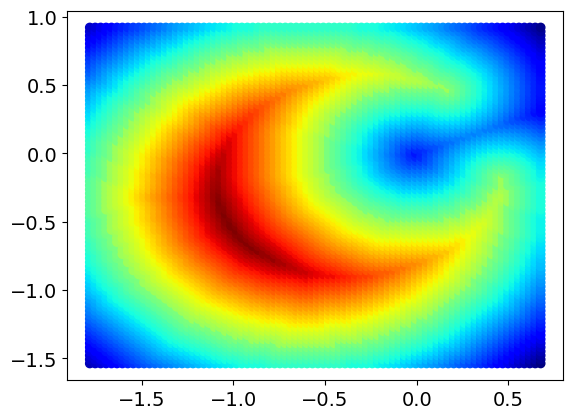

100%|#############################################################################################################################################| 500.0000/500.0 [00:40<00:00, 12.23sim_s/s]


n safe 4014
scan safe shape (4014, 3)
counts [684 684 676 ... 314 292 260]
pct 0.4


<Figure size 640x480 with 0 Axes>

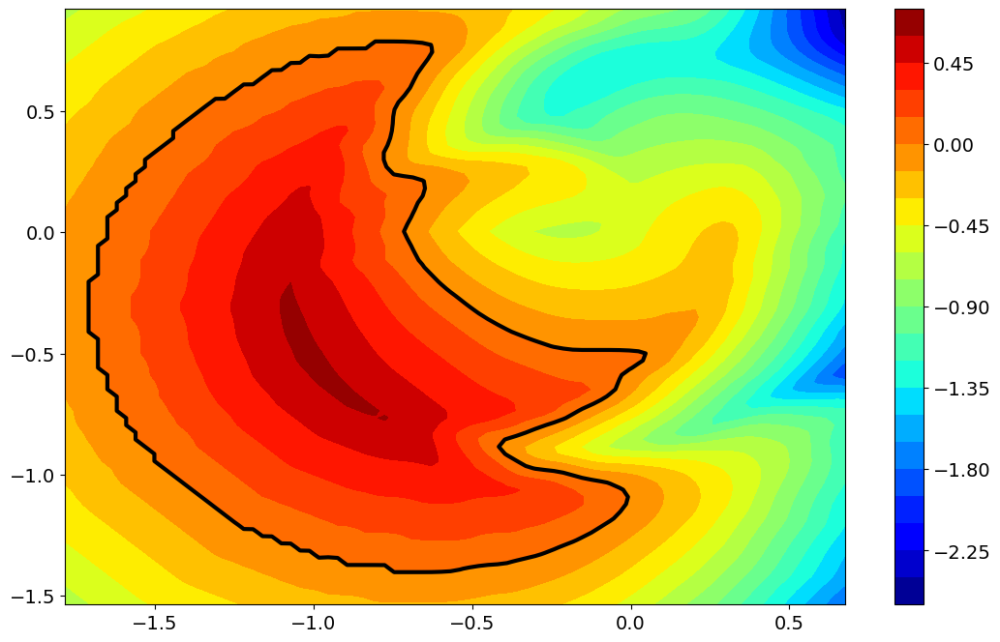

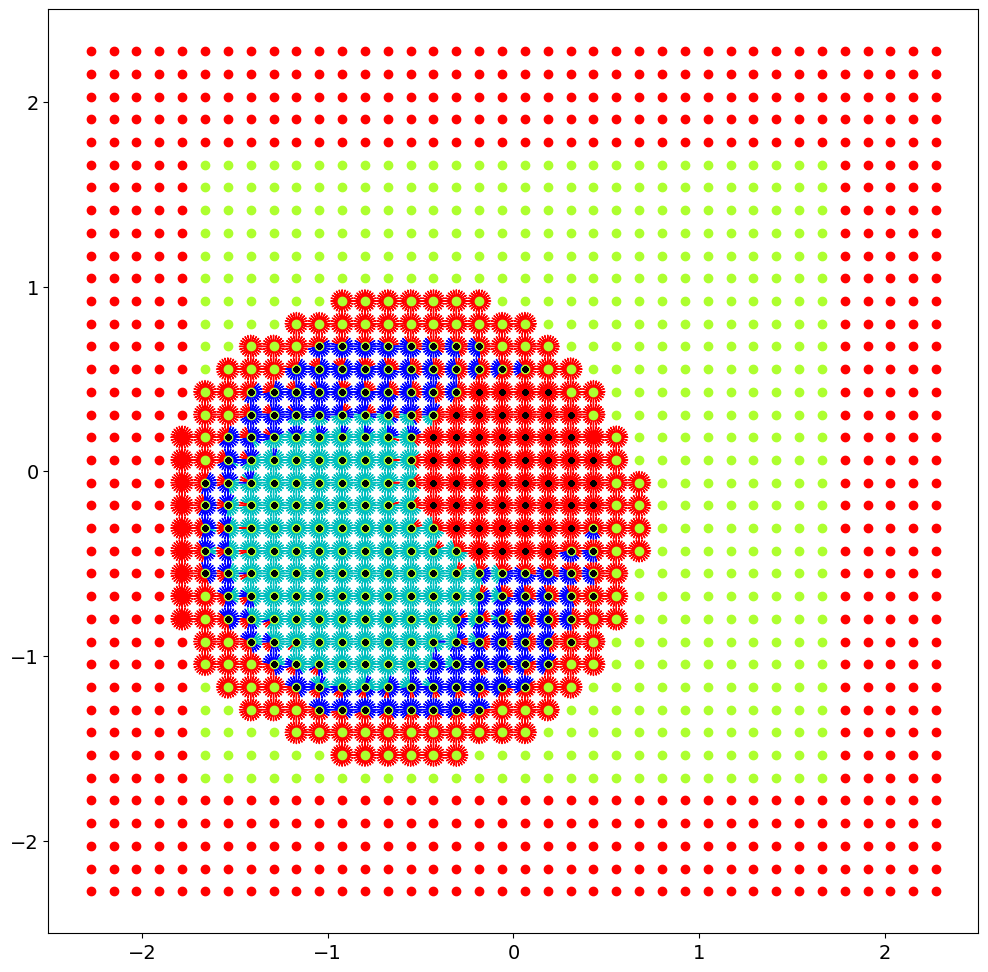

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Aug 28 11:29:01 AM: Your problem has 2410 variables, 1 constraints, and 0 parameters.
(CVXPY) Aug 28 11:29:01 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Aug 28 11:29:01 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Aug 28 11:29:01 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Aug 28 11:29:01 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Aug 28 11:29:01 AM: Compiling problem (target solver=CLARABEL)

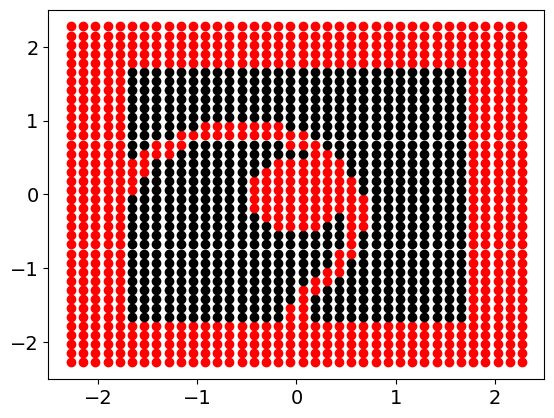

gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 116.27977
it 10 loss: 47.95452
it 20 loss: 30.459885
it 30 loss: 24.59823
it 40 loss: 22.208942
it 50 loss: 20.953224
it 60 loss: 20.226675
it 70 loss: 19.731344
it 80 loss: 19.372463
it 90 loss: 19.088287


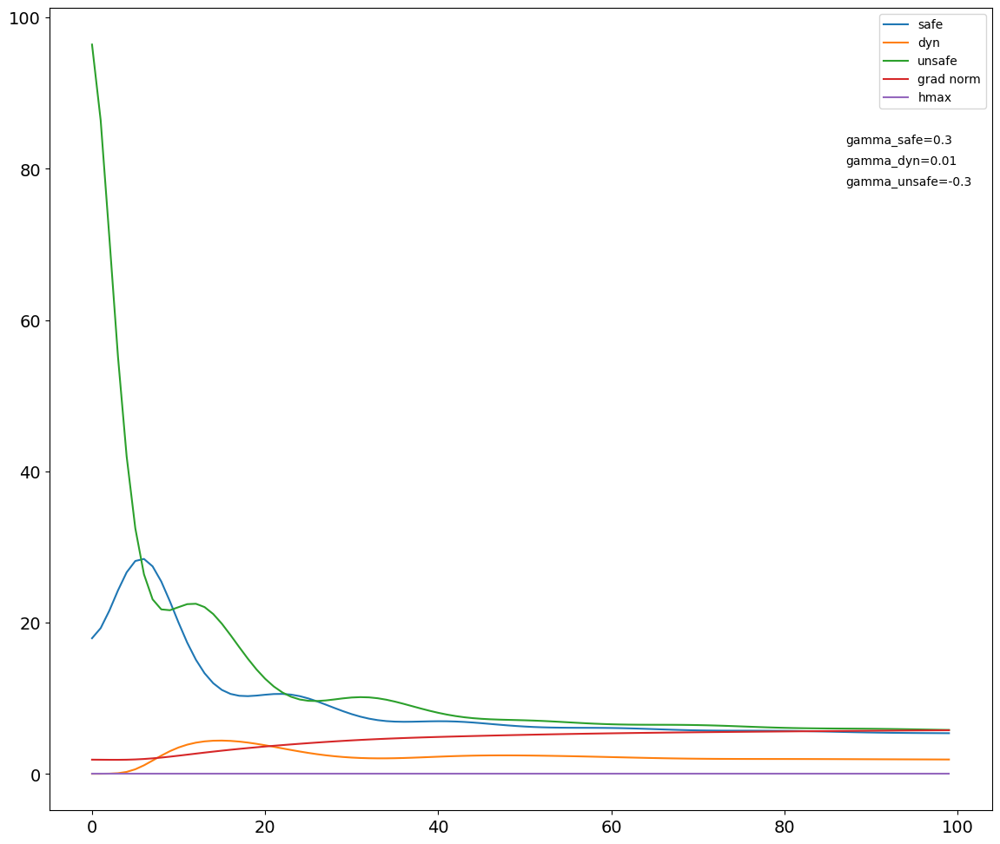

centers shape before:
(6400, 3)
(6275, 3)
numc 6275
cmax before 6400
numc <= self.cmax
Cnew shape before (6275, 3)
Cnew shape after (6275, 3)
theta shape before (6275,)
theta_shape after (6400,)
cmax after 6400
centers shape after
(6400, 3)
(6400, 3)
### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 3600
remainder 0


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 25/26 [00:33<00:01,  1.33s/it]


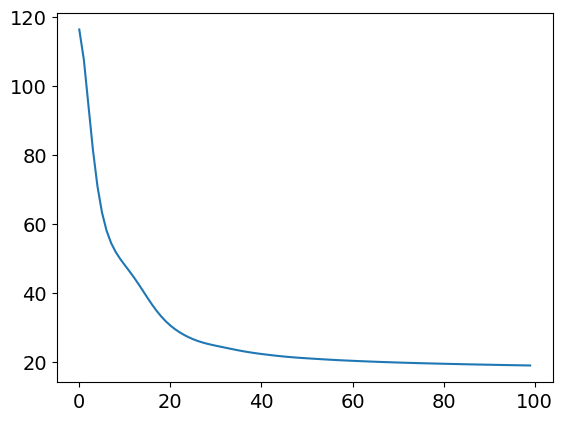

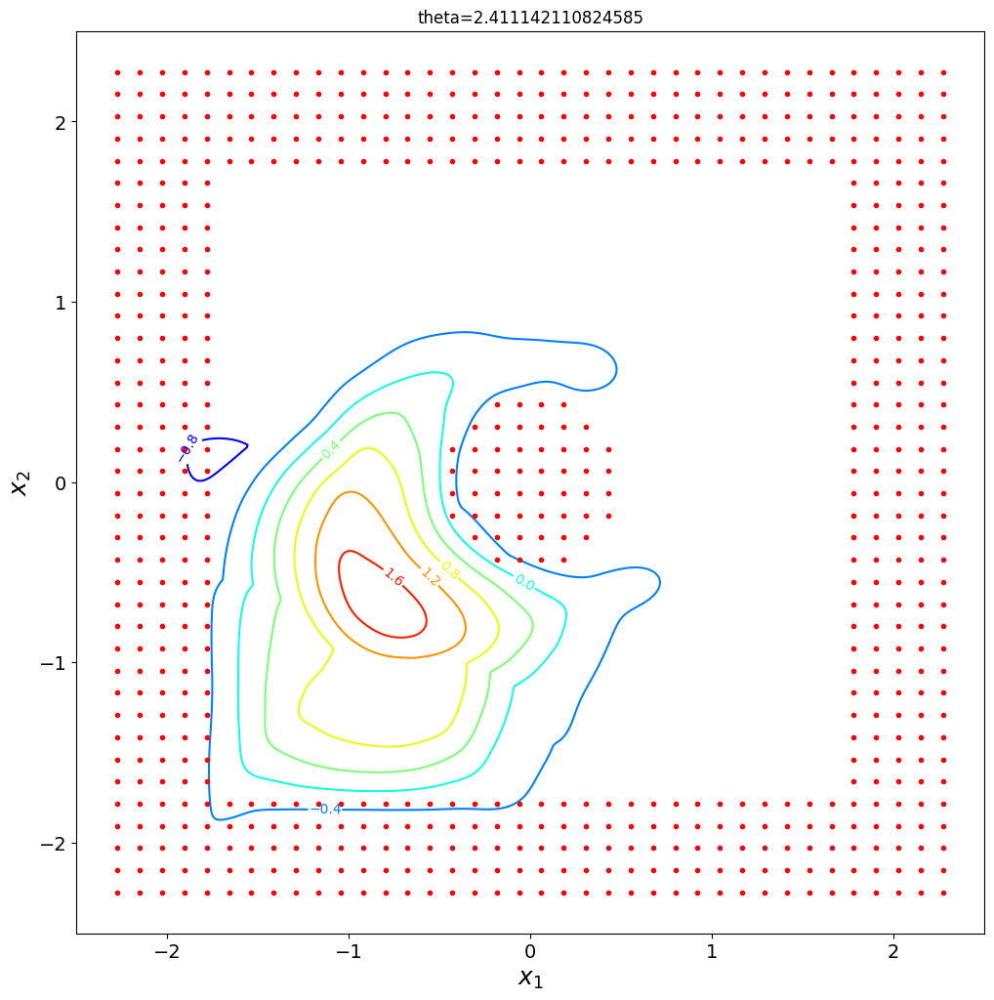

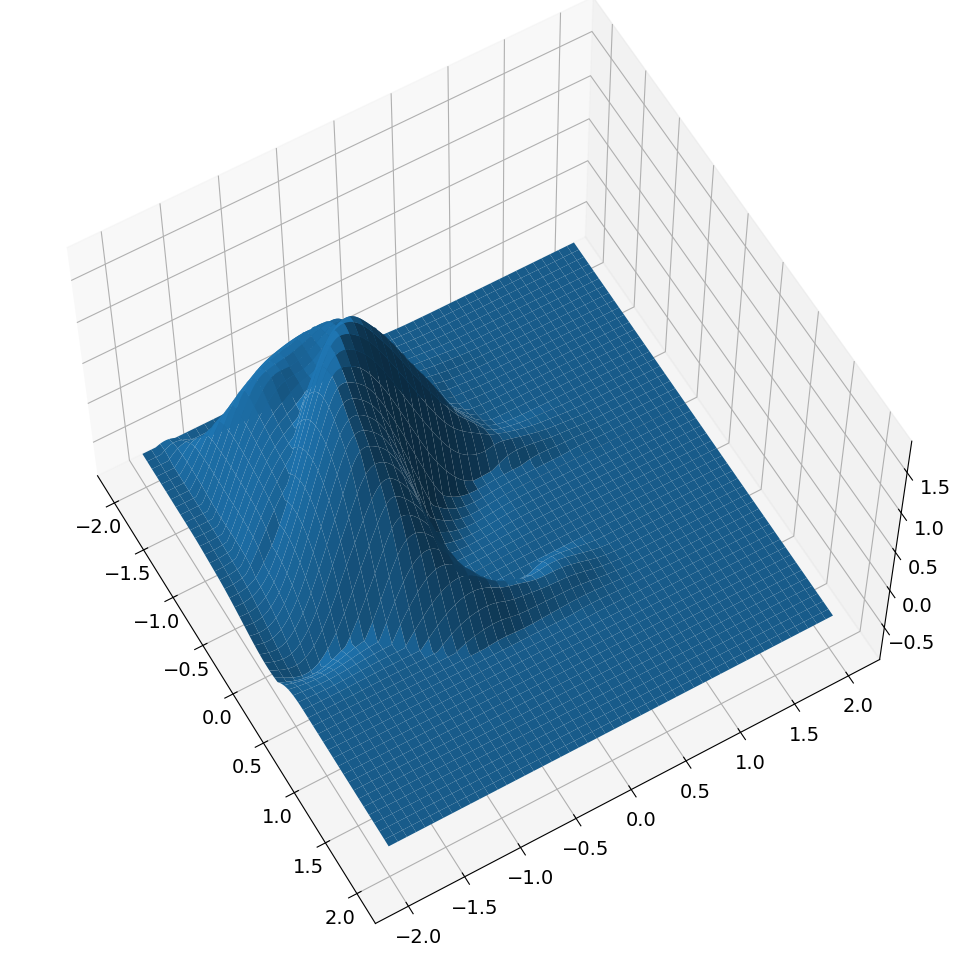

max h 1.8229187
num data 34656
partition 1386
remainder 6
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(6, 3)


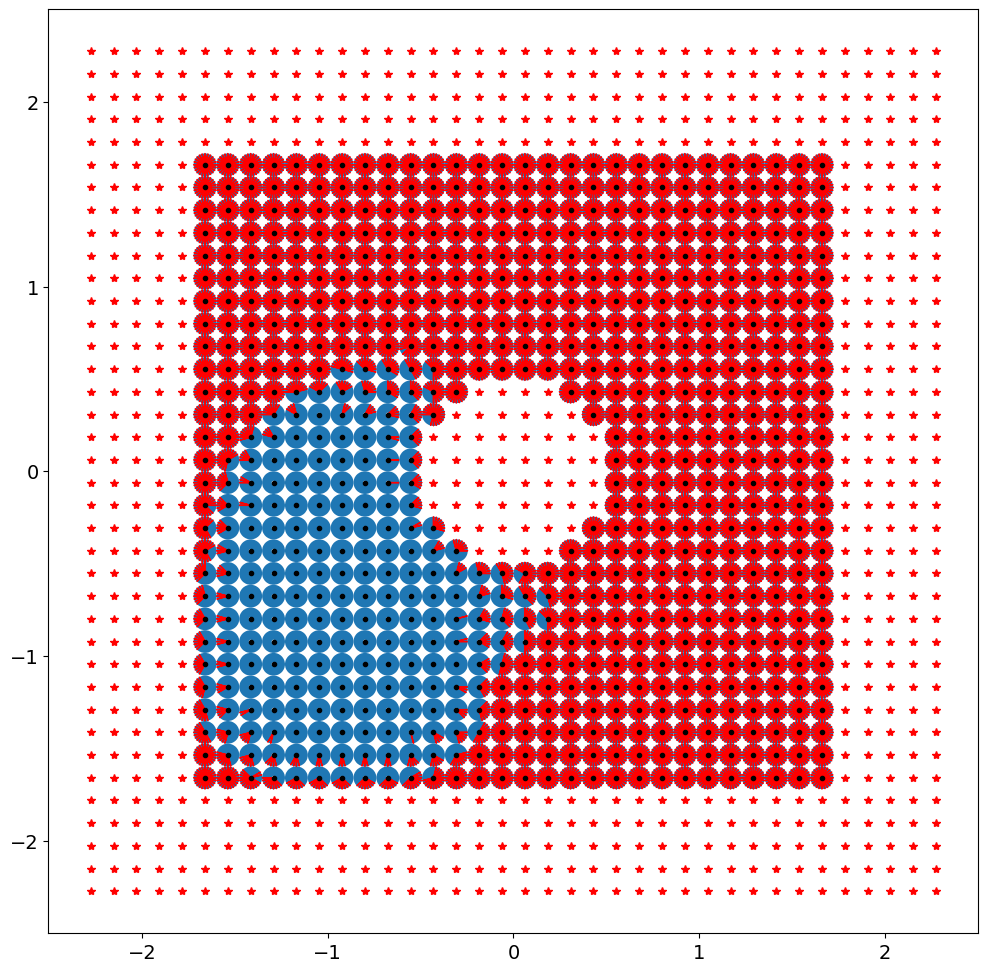

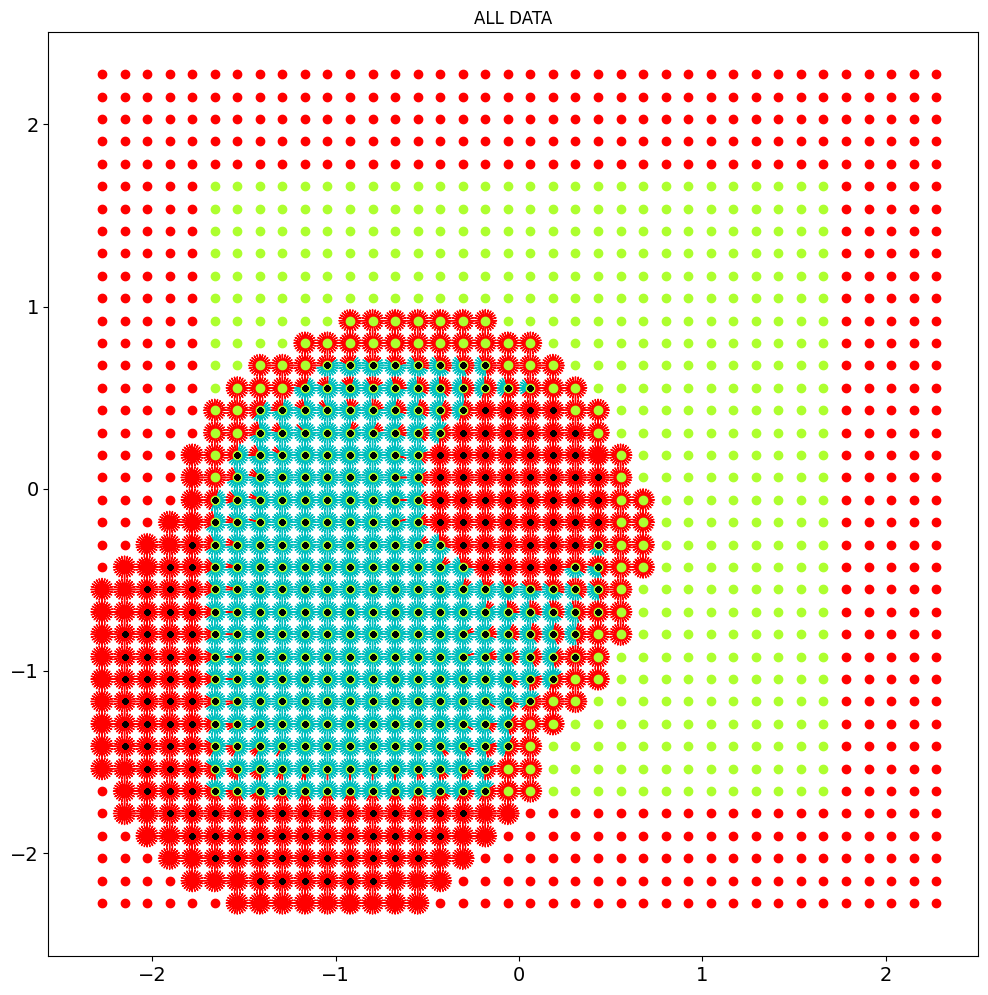

target: [ 1 -1  0]
position is [-0.59954333 -0.30300114  2.41114211]
start time is 160


 10%|██████████████▌                                                                                                                                       | 155/1600 [00:16<02:41,  8.96it/s]

val [0.4        0.01176054] max 0.4
val [0.4        0.02143128] max 0.4


 10%|██████████████▋                                                                                                                                       | 157/1600 [00:16<02:30,  9.62it/s]

val [0.4       0.0333668] max 0.4
val [0.4       0.0362097] max 0.4
val [0.4        0.03752376] max 0.4


 10%|███████████████                                                                                                                                       | 161/1600 [00:16<02:14, 10.73it/s]

val [0.4        0.03769441] max 0.4
val [0.4        0.03709725] max 0.4
val [0.4        0.03601502] max 0.4


 10%|███████████████▎                                                                                                                                      | 163/1600 [00:17<02:09, 11.05it/s]

val [0.4       0.0347023] max 0.4
val [0.4        0.03333282] max 0.4
val [0.4        0.03201161] max 0.4


 10%|███████████████▋                                                                                                                                      | 167/1600 [00:17<02:03, 11.58it/s]

val [0.4        0.03085448] max 0.4
val [0.4        0.03006904] max 0.4
val [0.4        0.02987128] max 0.4


 11%|███████████████▊                                                                                                                                      | 169/1600 [00:17<02:03, 11.63it/s]

val [0.4        0.03028201] max 0.4
val [0.4        0.03129864] max 0.4


 11%|████████████████                                                                                                                                      | 171/1600 [00:18<03:09,  7.56it/s]

val [0.4        0.03290403] max 0.4
val [0.4       0.0350895] max 0.4
val [0.4        0.03782863] max 0.4


 11%|████████████████▍                                                                                                                                     | 175/1600 [00:18<02:33,  9.27it/s]

val [0.4        0.04104476] max 0.4
val [0.4        0.04459066] max 0.4
val [0.4        0.04825584] max 0.4


 11%|████████████████▌                                                                                                                                     | 177/1600 [00:18<02:23,  9.90it/s]

val [0.4        0.05178974] max 0.4
val [0.4        0.05492965] max 0.4
val [0.4        0.05754454] max 0.4


 11%|████████████████▉                                                                                                                                     | 180/1600 [00:18<02:28,  9.55it/s]

### PLOTTING h(x(t)) ###


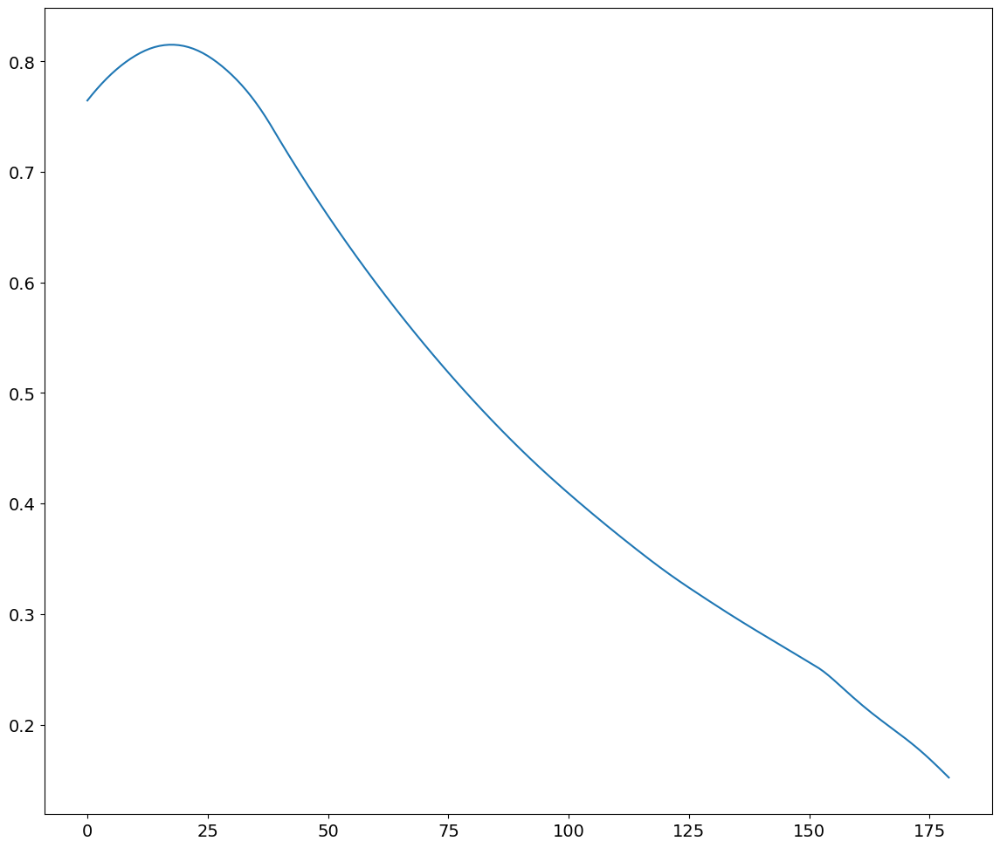

### PLOTTING CONTROL SIGNAL ###


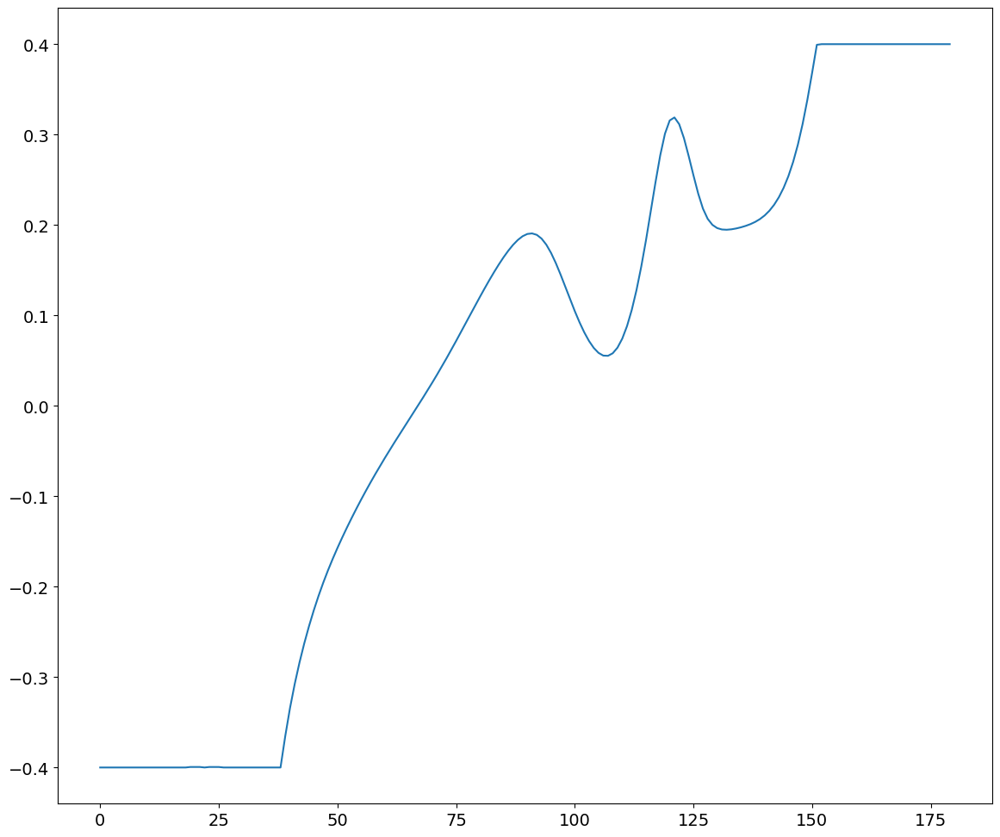

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 60/61 [00:34<00:00,  1.71it/s]


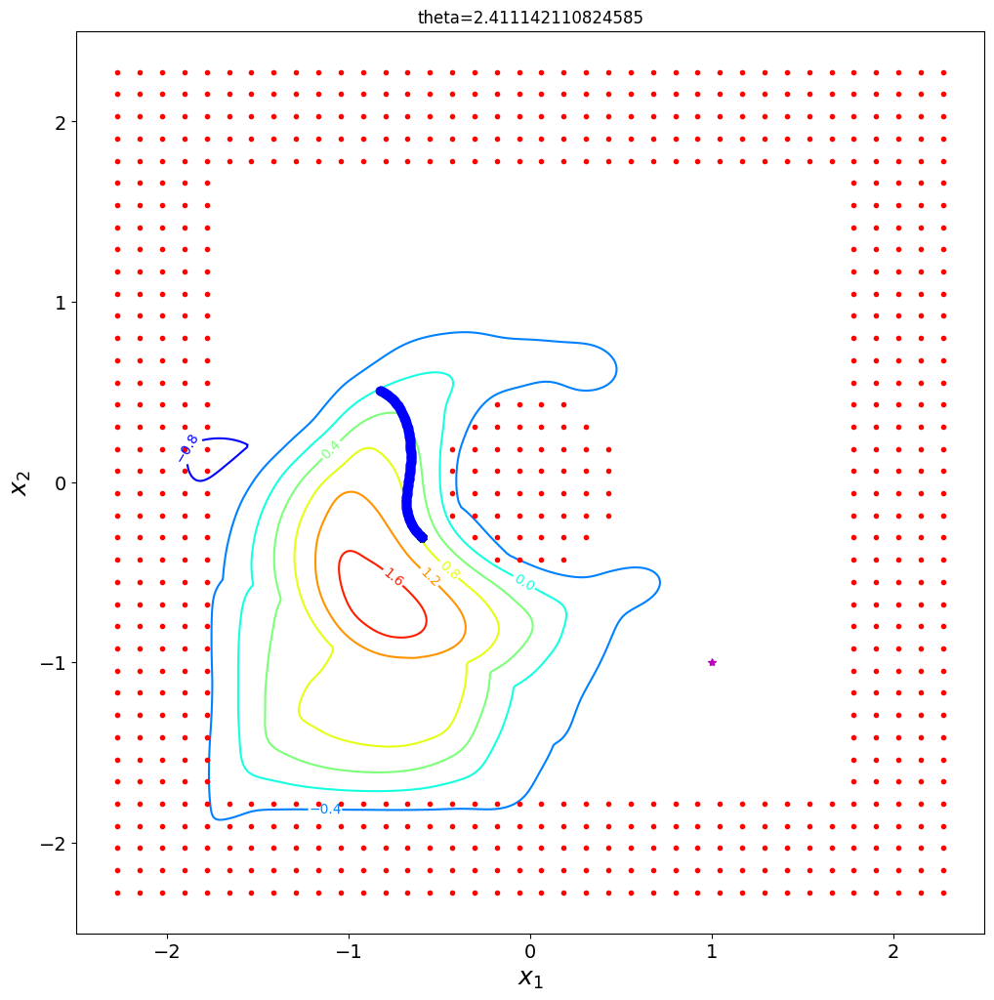

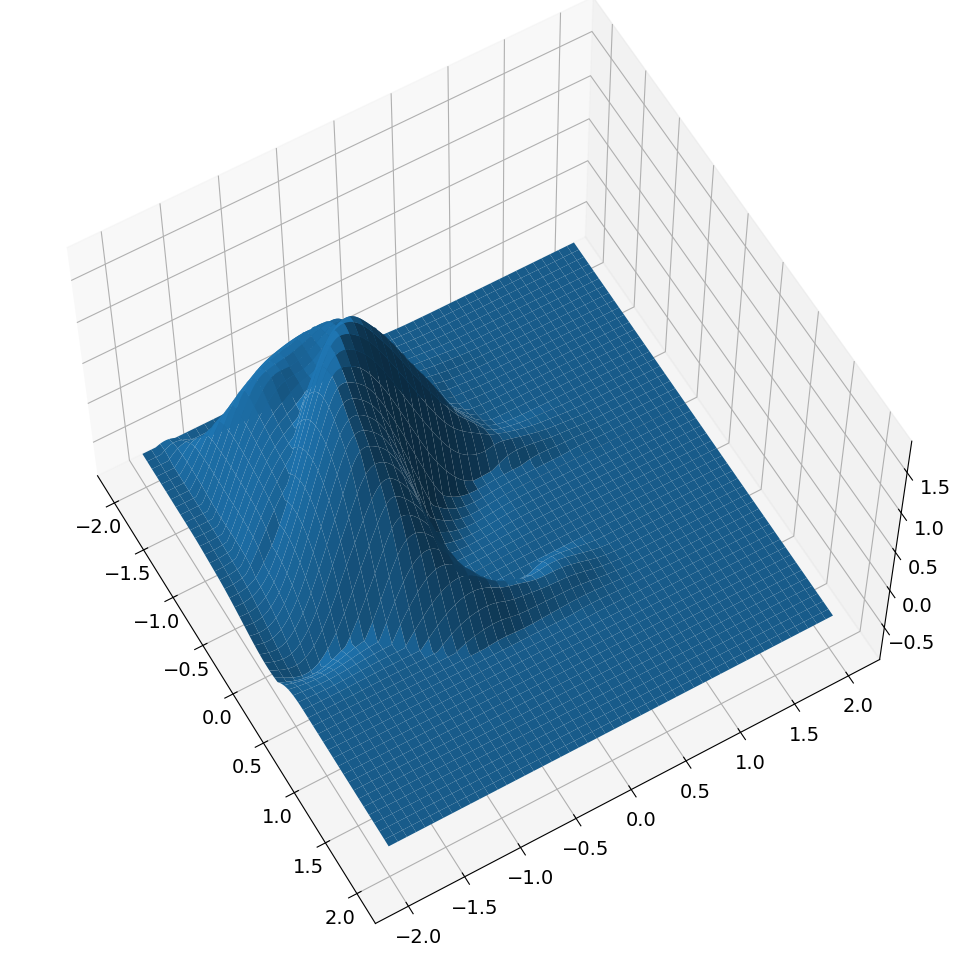

max h 1.8229187
percent violation: 0.0175
new position is [-0.83050901  0.51030928  2.7052269 ]
new time is 240
dx: 0.8951563188139469


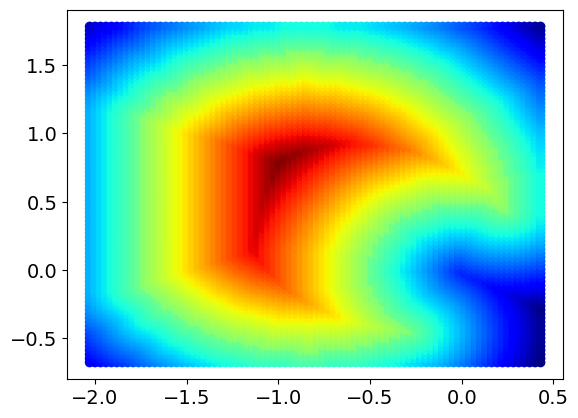

100%|#############################################################################################################################################| 500.0000/500.0 [00:41<00:00, 12.06sim_s/s]


n safe 4419
scan safe shape (4419, 3)
counts [574 586 599 ... 463 439 415]
pct 0.4


<Figure size 640x480 with 0 Axes>

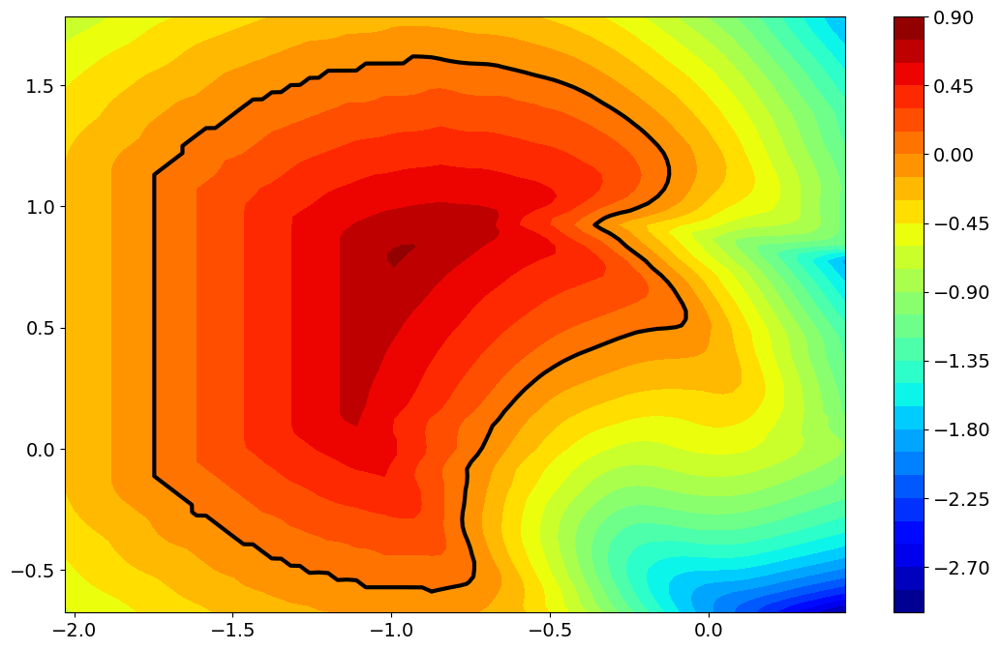

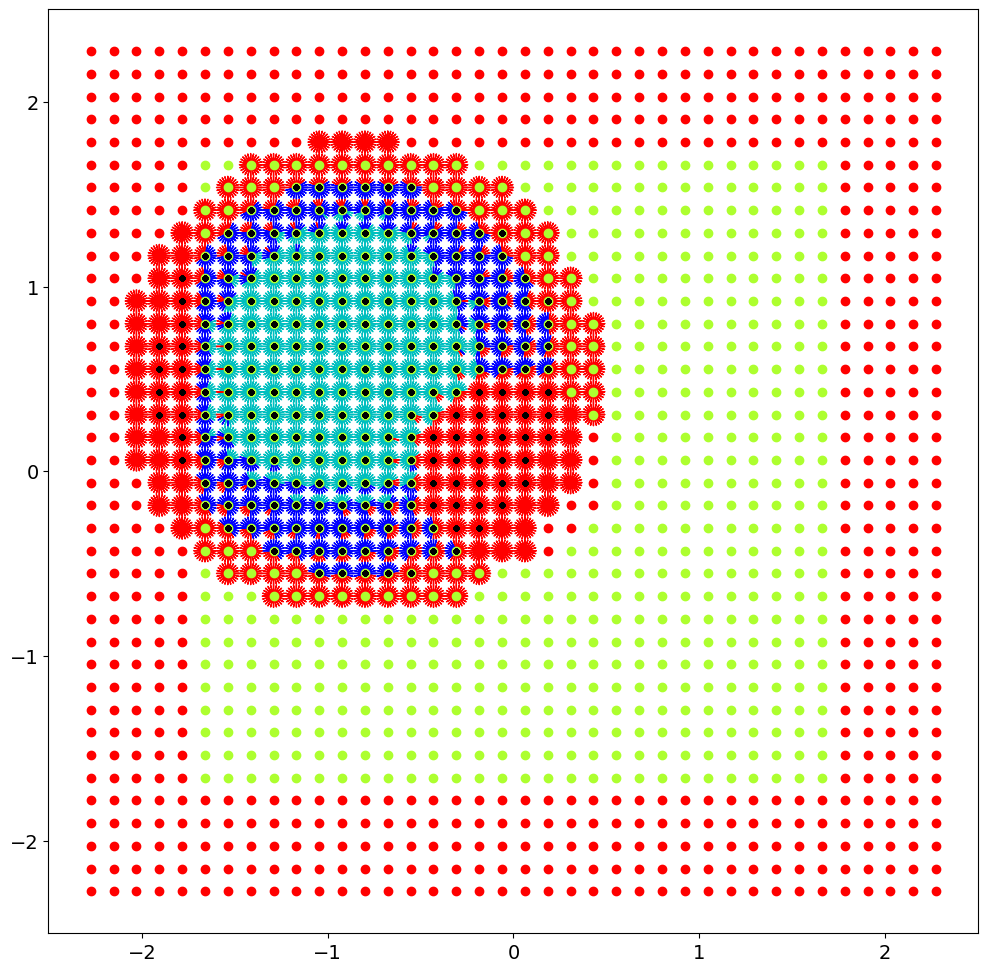

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Aug 28 11:36:26 AM: Your problem has 2652 variables, 1 constraints, and 0 parameters.
(CVXPY) Aug 28 11:36:26 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Aug 28 11:36:26 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Aug 28 11:36:26 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Aug 28 11:36:26 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Aug 28 11:36:26 AM: Compiling problem (target solver=CLARABEL)

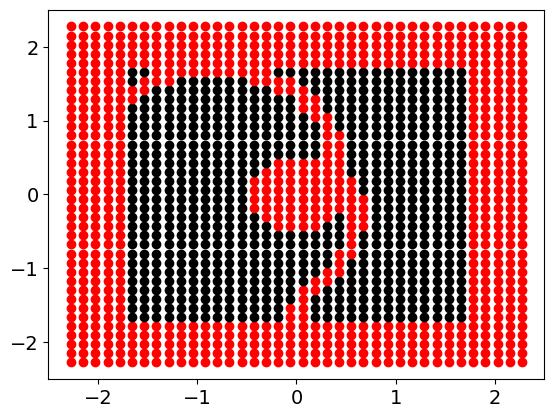

gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 96.116554
it 10 loss: 33.082733
it 20 loss: 20.634502
it 30 loss: 16.290953
it 40 loss: 14.979168
it 50 loss: 14.230371
it 60 loss: 13.786491
it 70 loss: 13.4931
it 80 loss: 13.271386
it 90 loss: 13.09587


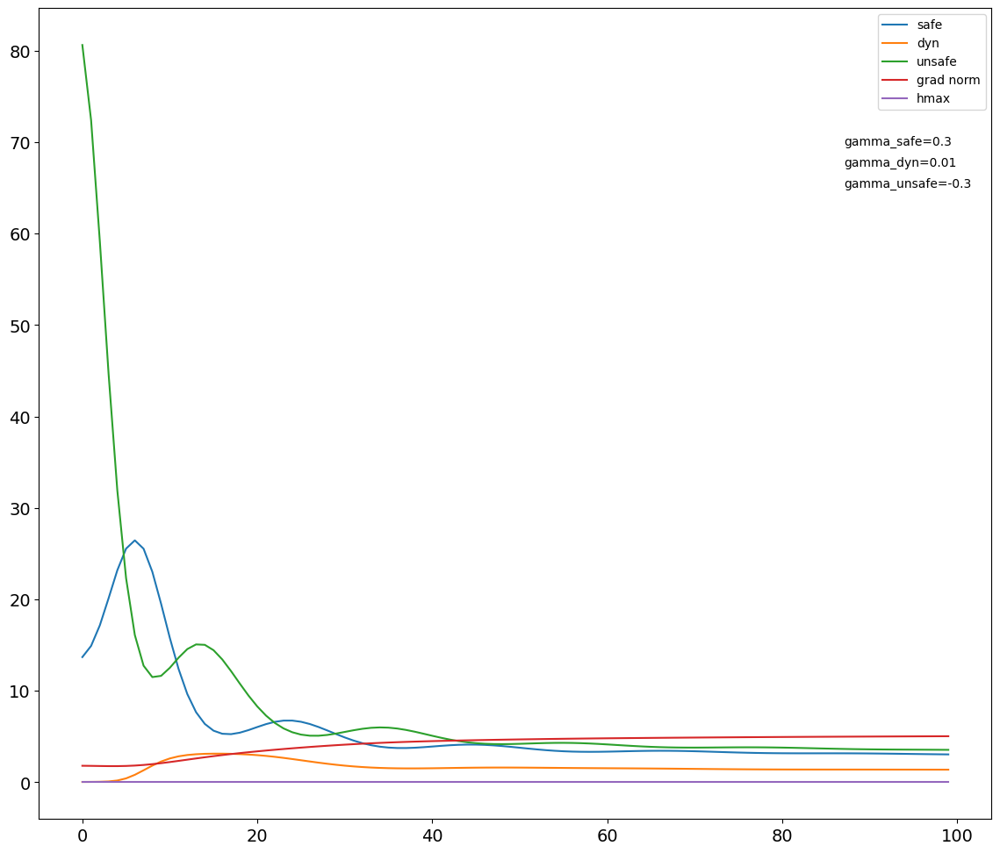

centers shape before:
(6400, 3)
(6400, 3)
(6325, 3)
numc 6325
cmax before 6400
numc <= self.cmax
Cnew shape before (6325, 3)
Cnew shape after (6325, 3)
theta shape before (6325,)
theta_shape after (6400,)
cmax after 6400
centers shape after
(6400, 3)
(6400, 3)
(6400, 3)
### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 3600
remainder 0


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 25/26 [00:47<00:01,  1.91s/it]


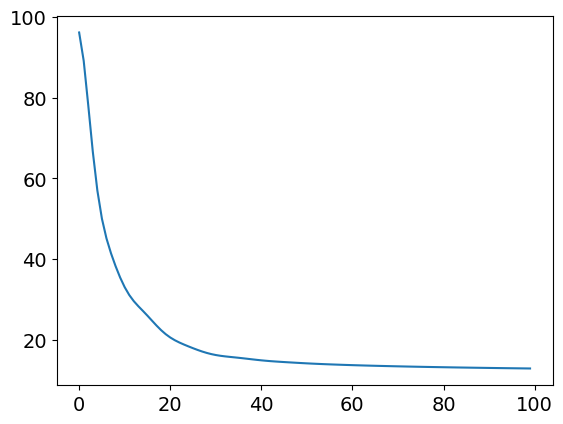

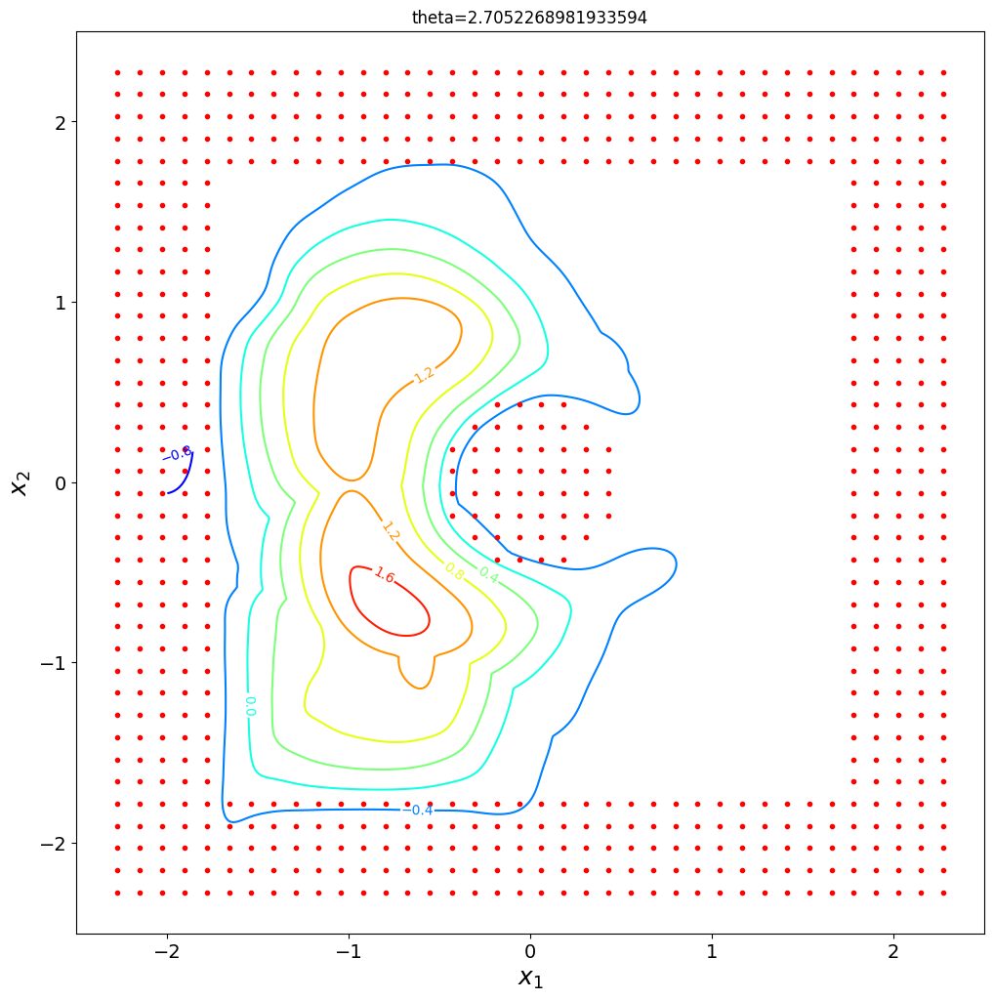

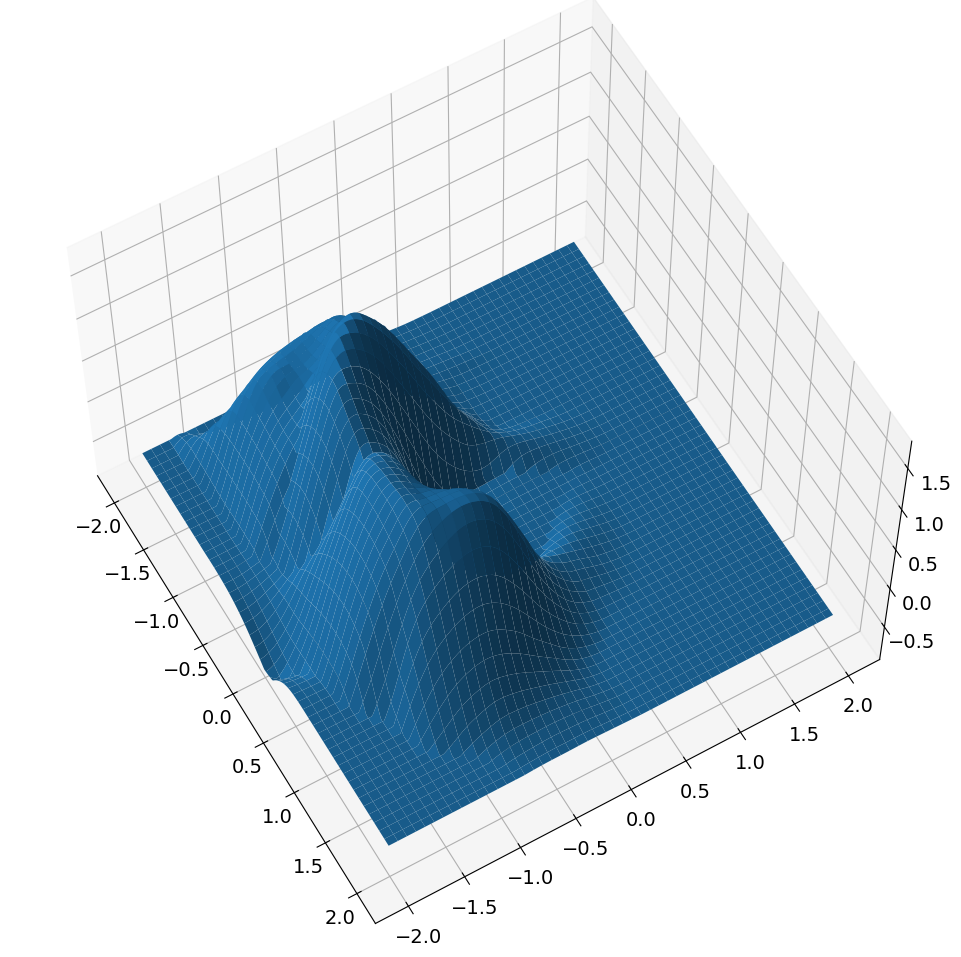

max h 1.7656634
num data 34656
partition 1386
remainder 6
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(6, 3)


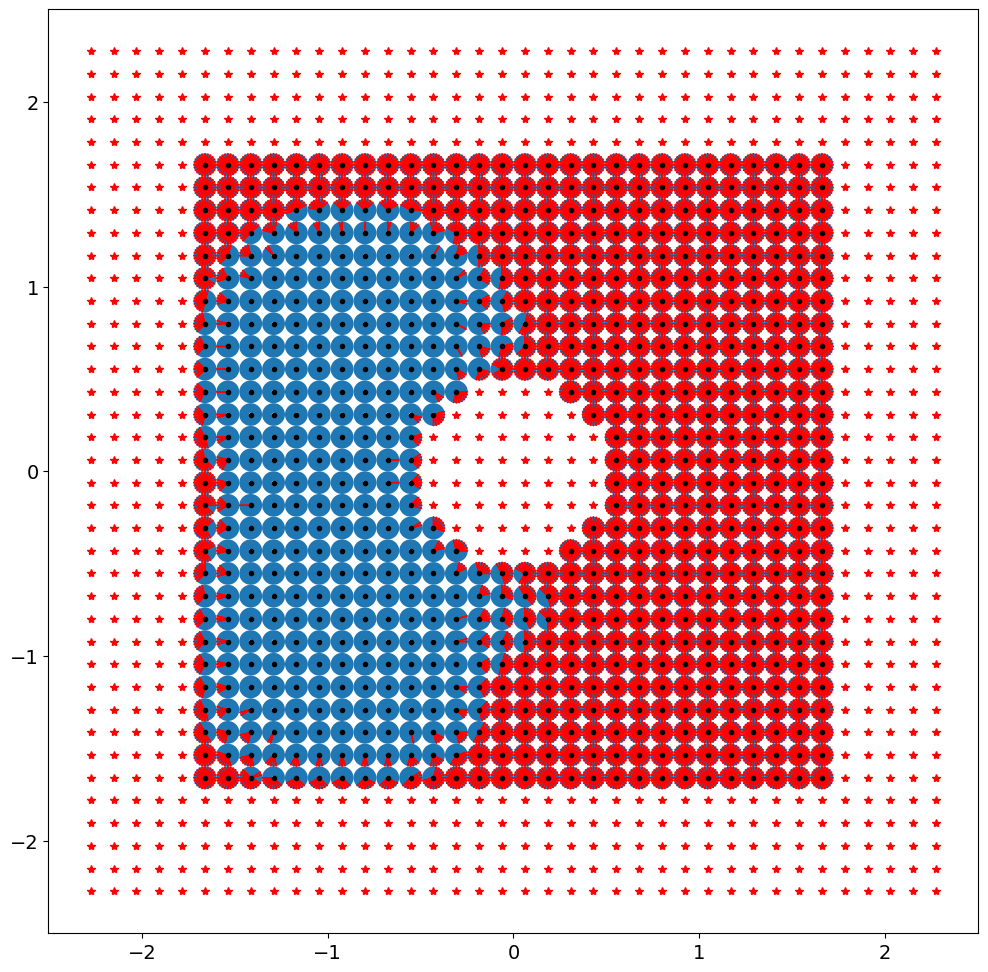

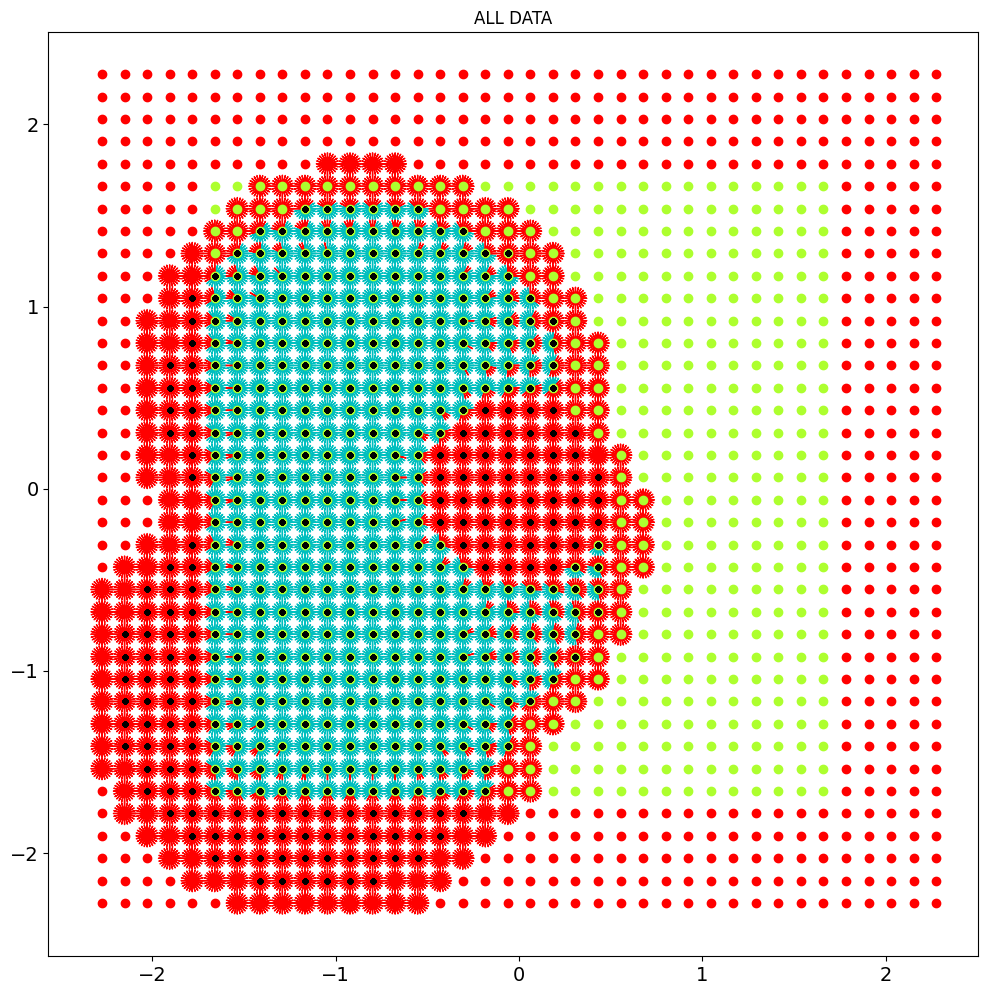

target: [1.         1.         1.57079633]
position is [-0.83050901  0.51030928  2.7052269 ]
start time is 240


 14%|████████████████████▍                                                                                                                                 | 218/1600 [00:21<02:18,  9.95it/s]

### PLOTTING h(x(t)) ###


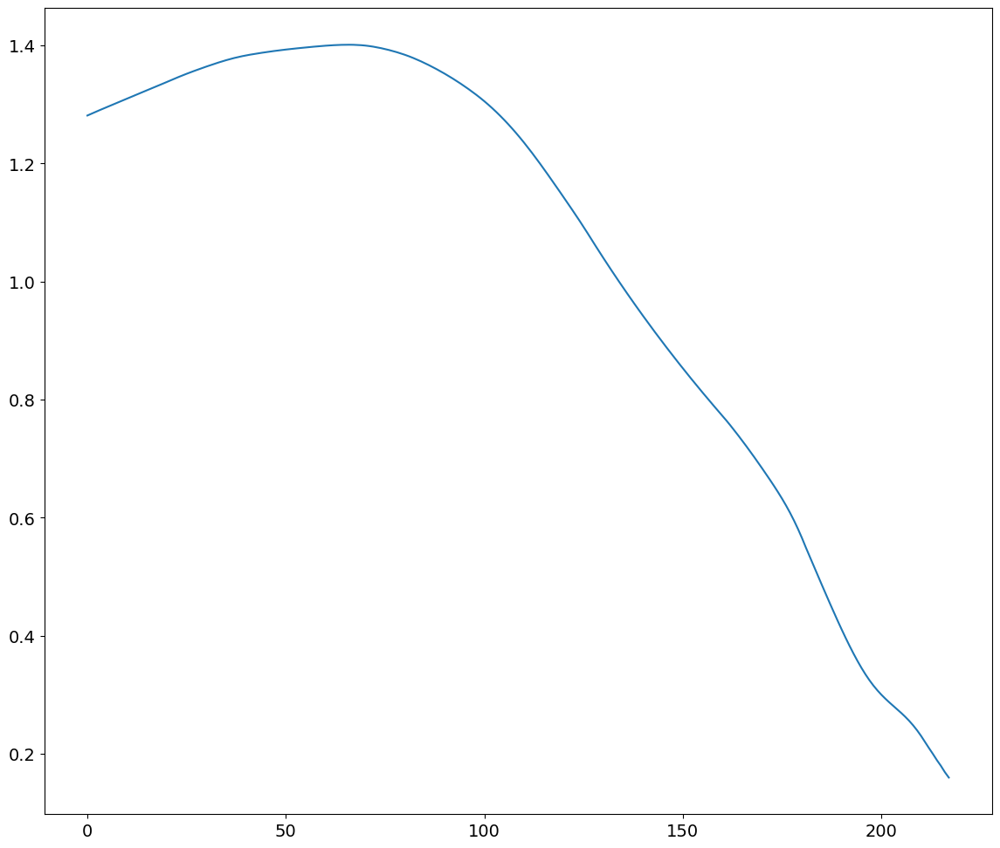

### PLOTTING CONTROL SIGNAL ###


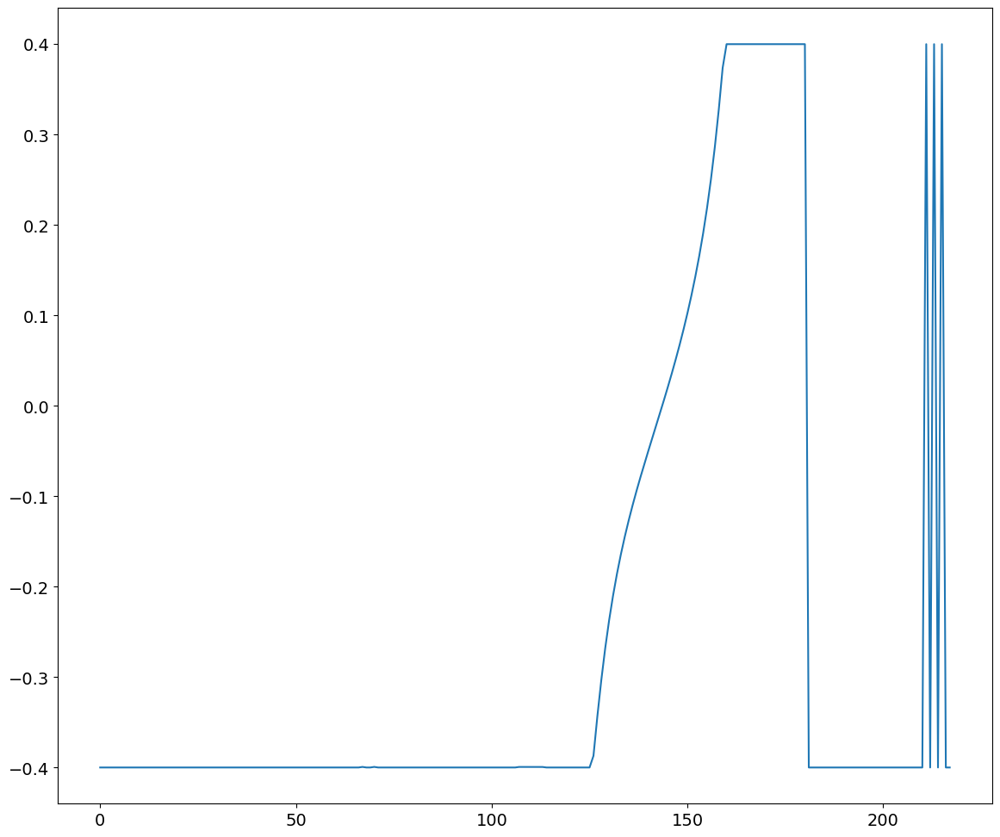

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 60/61 [00:49<00:00,  1.20it/s]


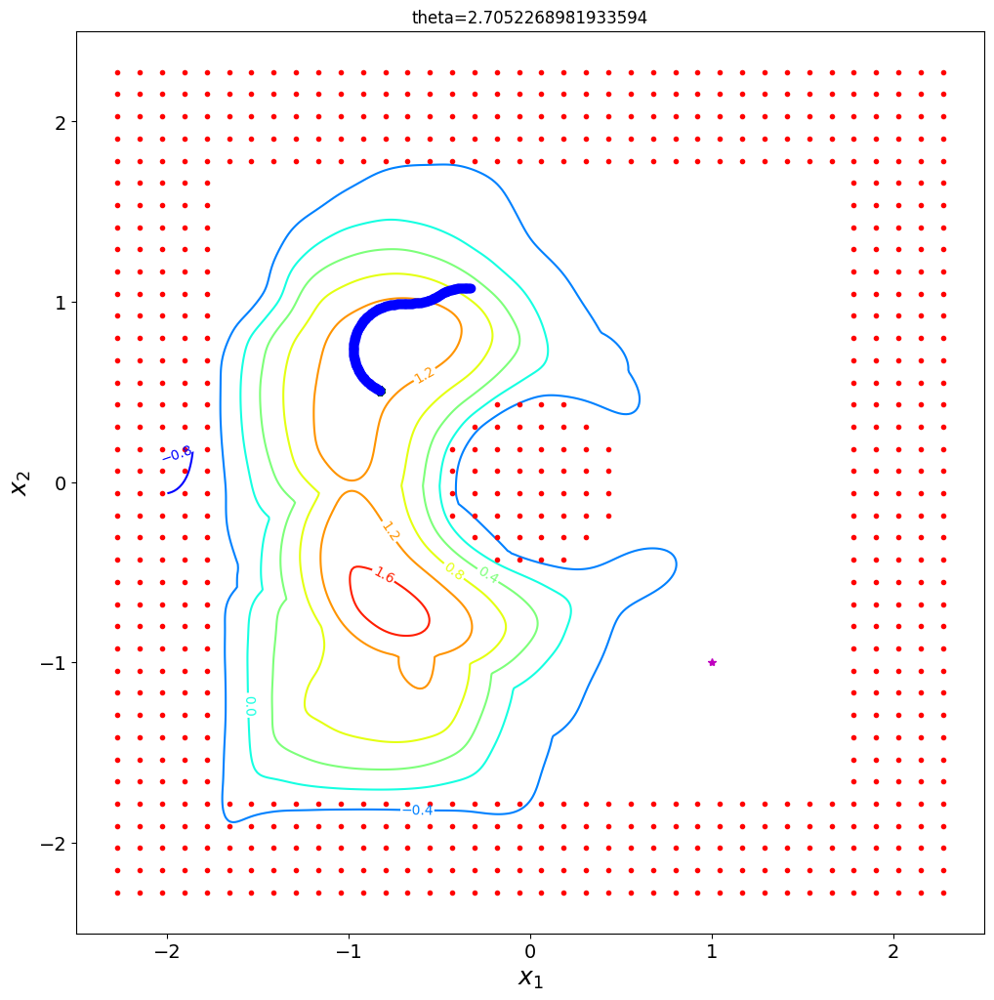

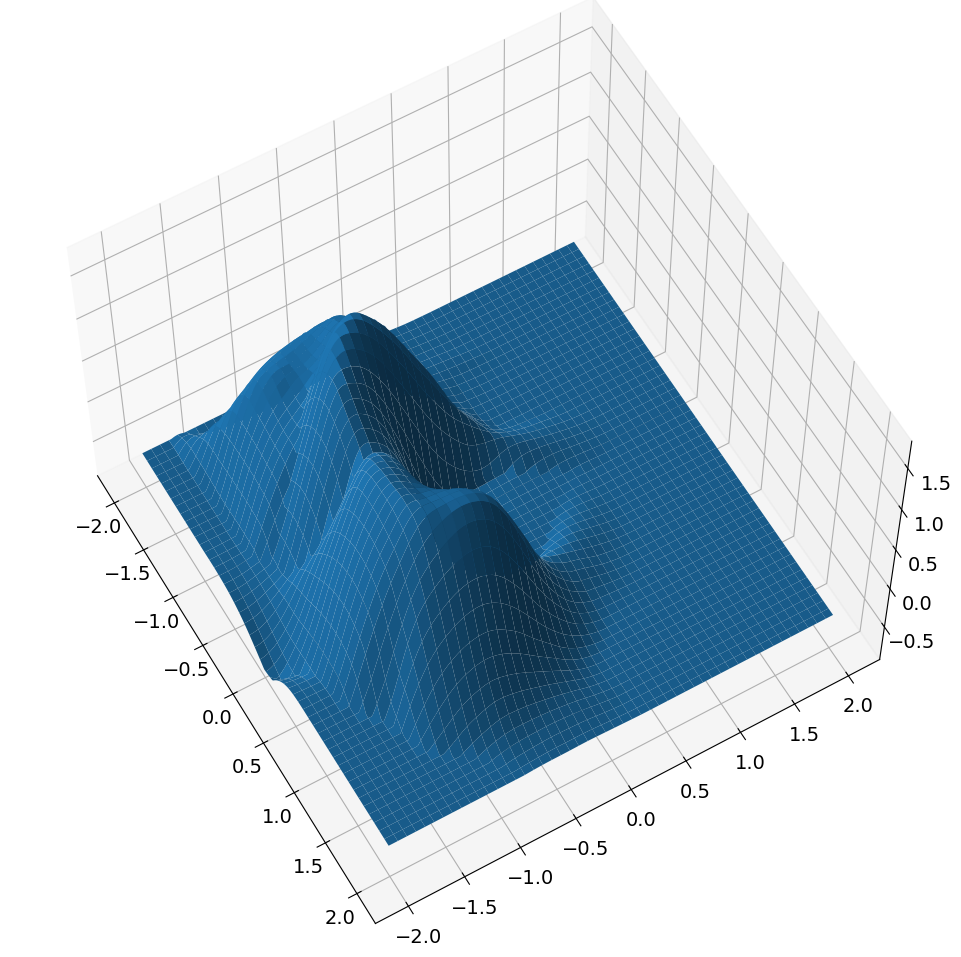

max h 1.7656634
percent violation: 0.03625
new position is [-0.32793817  1.07658017 -0.03386722]
new time is 320
dx: 2.8418087093516453


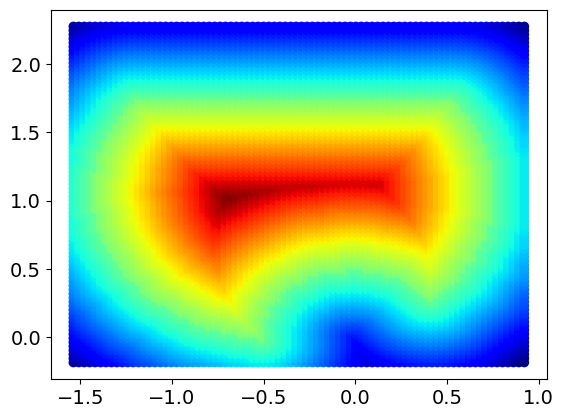

100%|#############################################################################################################################################| 500.0000/500.0 [00:42<00:00, 11.80sim_s/s]


n safe 4111
scan safe shape (4111, 3)
counts [621 609 594 ... 457 442 437]
pct 0.4


<Figure size 640x480 with 0 Axes>

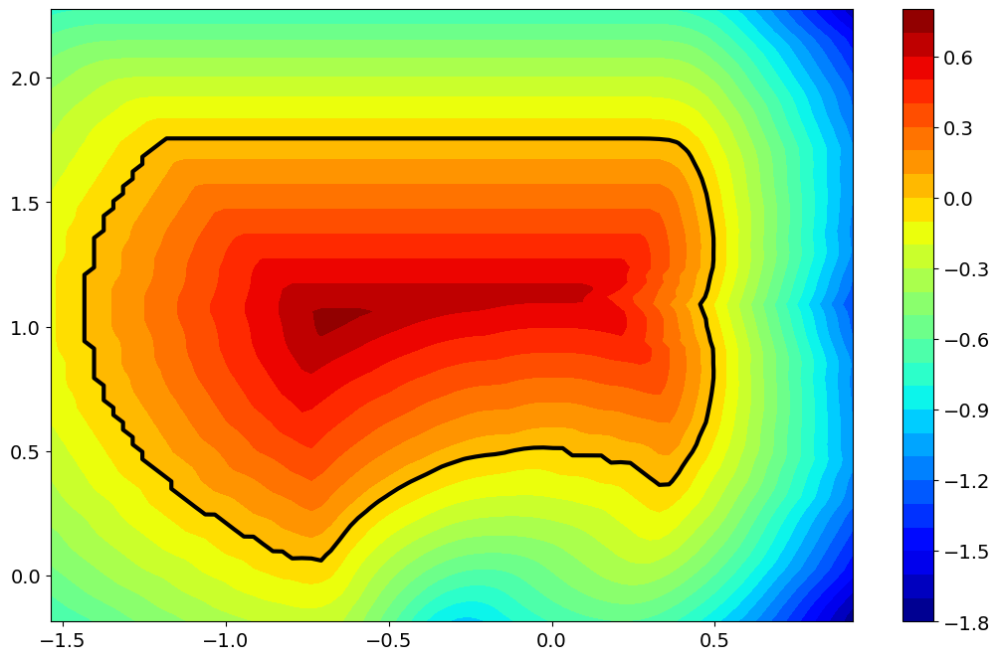

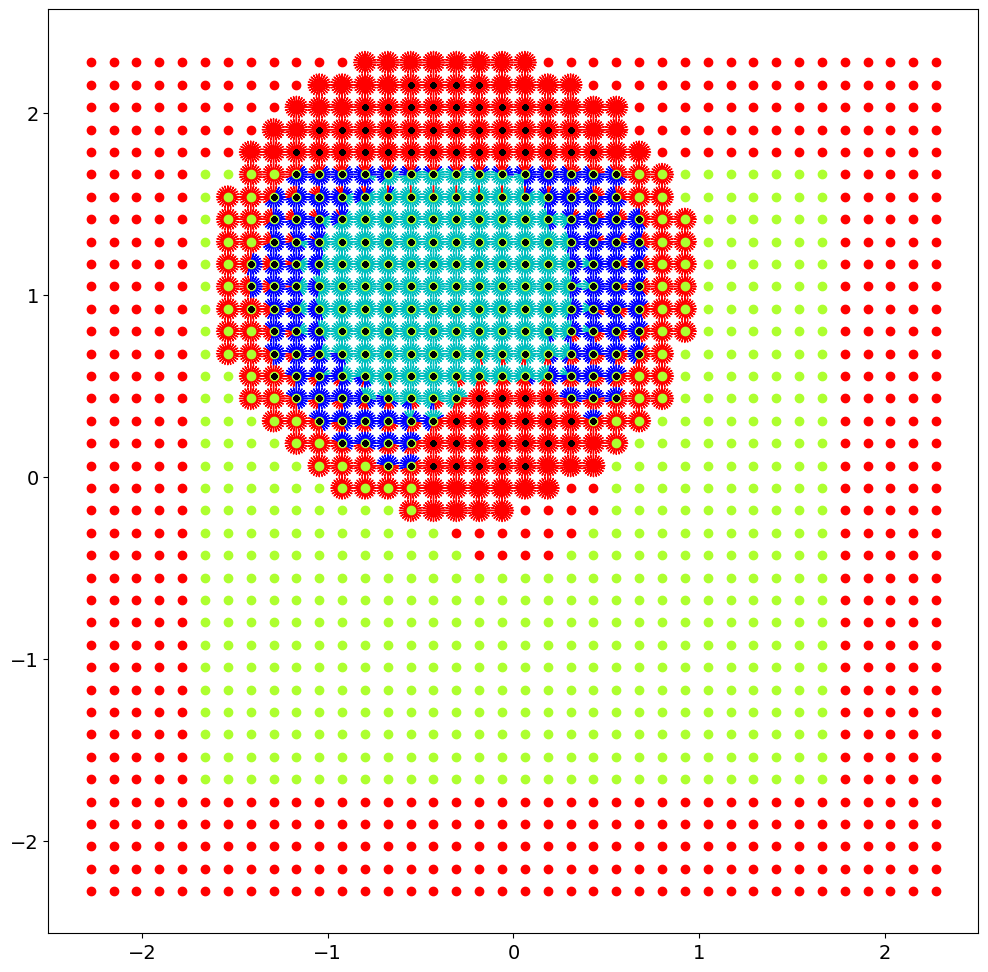

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Aug 28 11:45:47 AM: Your problem has 2467 variables, 1 constraints, and 0 parameters.
(CVXPY) Aug 28 11:45:47 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Aug 28 11:45:47 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Aug 28 11:45:47 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Aug 28 11:45:47 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Aug 28 11:45:47 AM: Compiling problem (target solver=CLARABEL)

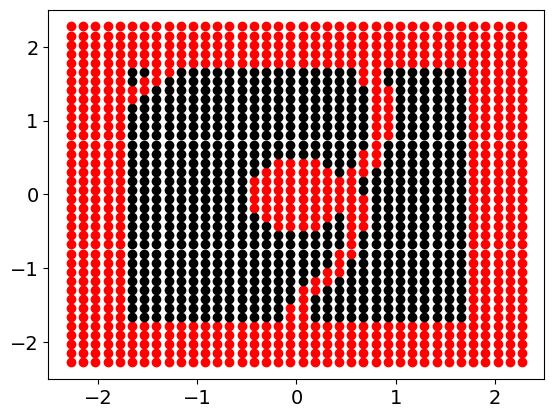

gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 95.91334
it 10 loss: 31.48276
it 20 loss: 19.781752
it 30 loss: 15.785925
it 40 loss: 14.452855
it 50 loss: 13.661625
it 60 loss: 13.268566
it 70 loss: 12.983455
it 80 loss: 12.776538
it 90 loss: 12.609802


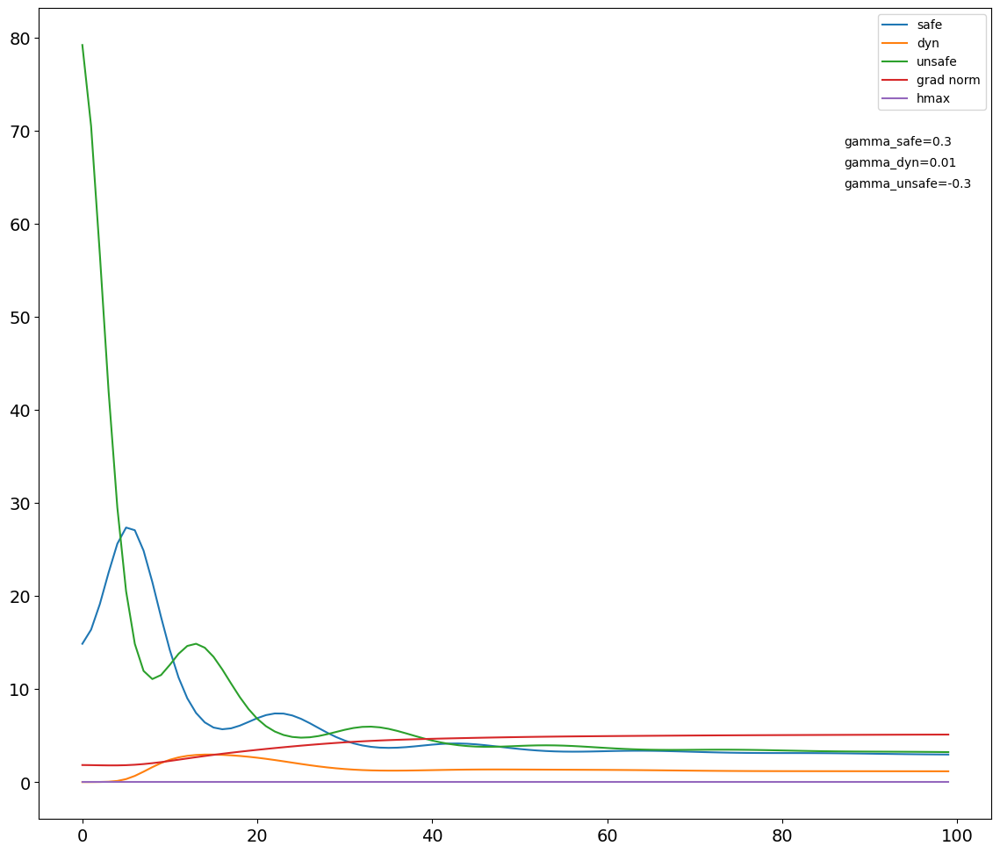

centers shape before:
(6400, 3)
(6400, 3)
(6400, 3)
(6350, 3)
numc 6350
cmax before 6400
numc <= self.cmax
Cnew shape before (6350, 3)
Cnew shape after (6350, 3)
theta shape before (6350,)
theta_shape after (6400,)
cmax after 6400
centers shape after
(6400, 3)
(6400, 3)
(6400, 3)
(6400, 3)
### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 3600
remainder 0


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 25/26 [01:05<00:02,  2.63s/it]


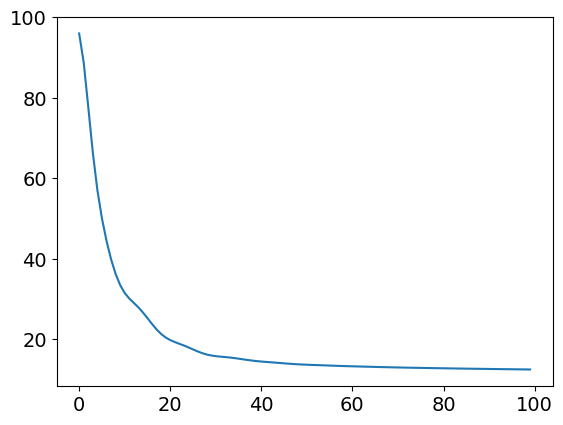

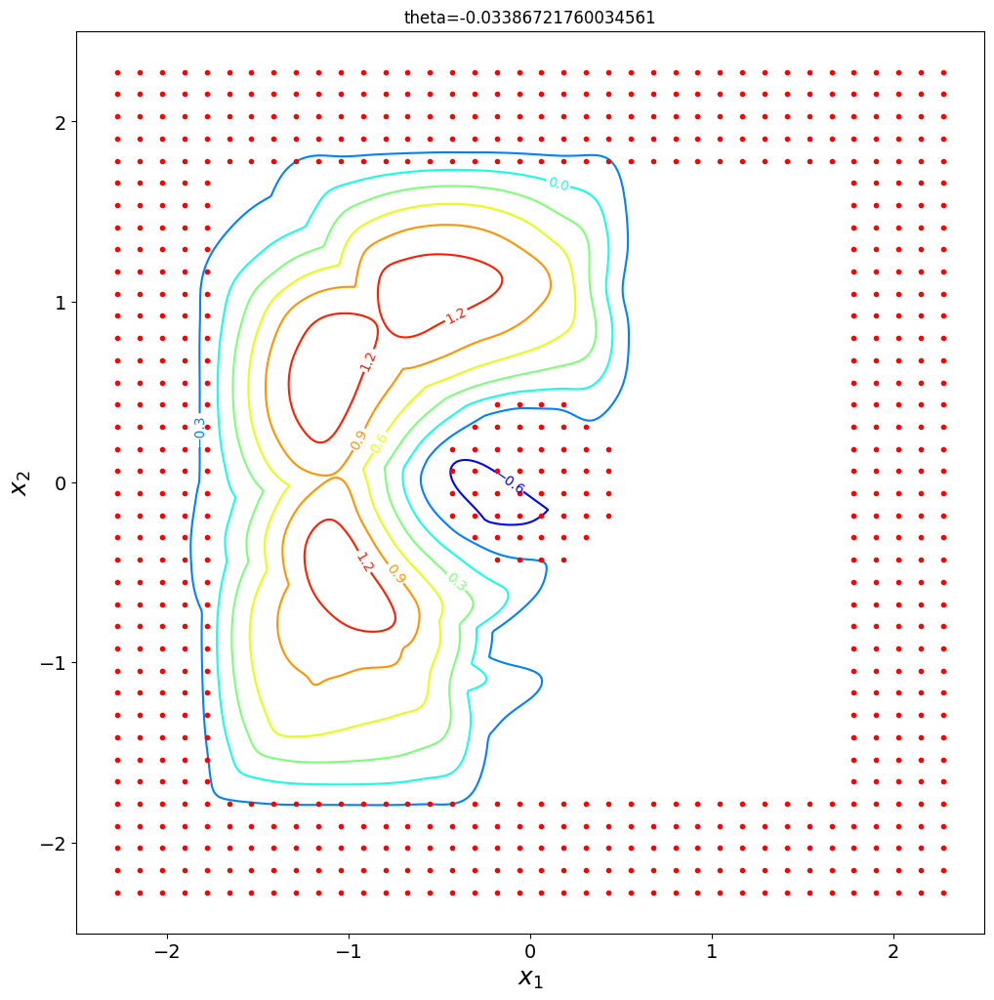

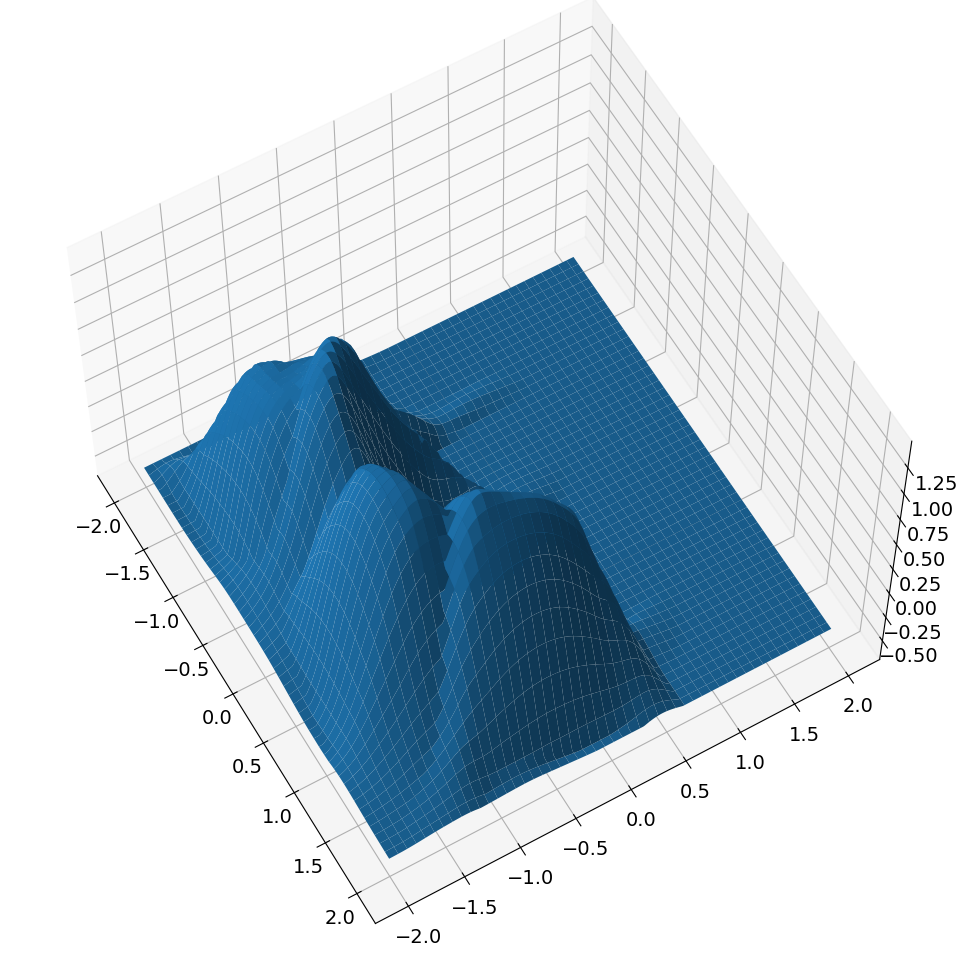

max h 1.4572448
num data 34656
partition 1386
remainder 6
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(1386, 3)
(6, 3)


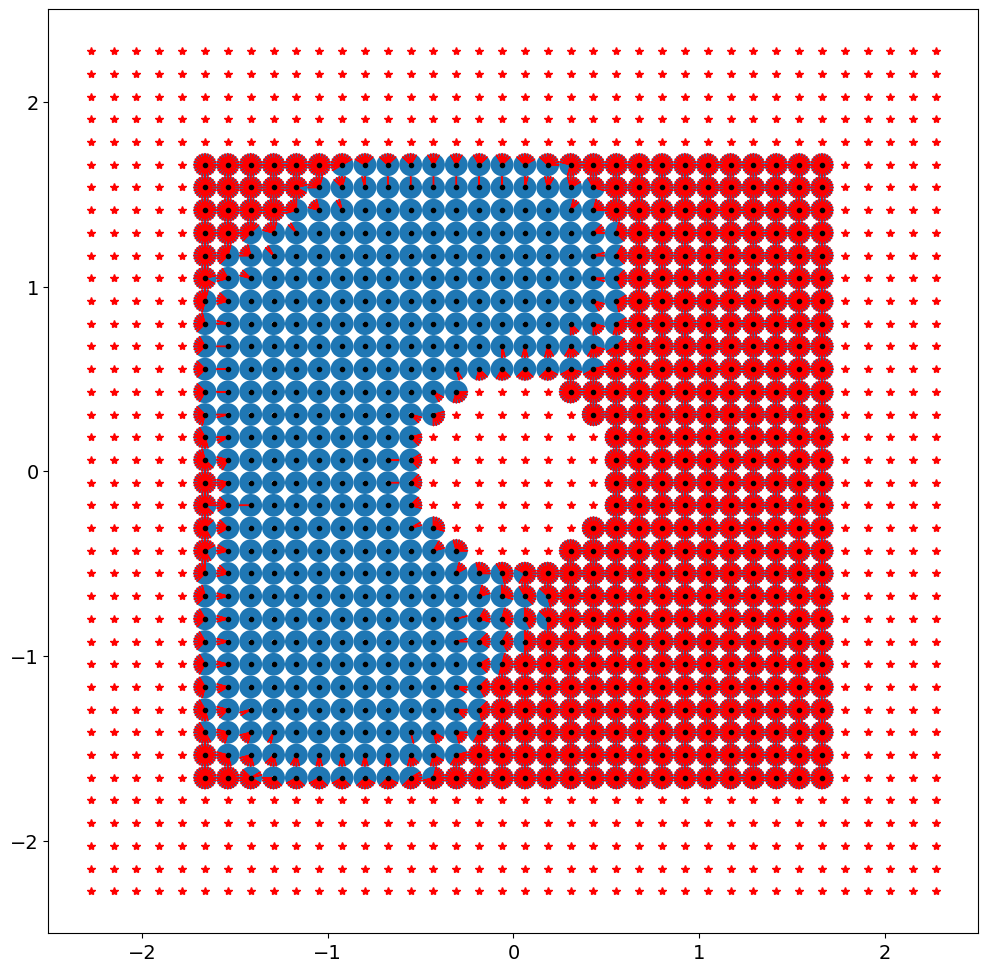

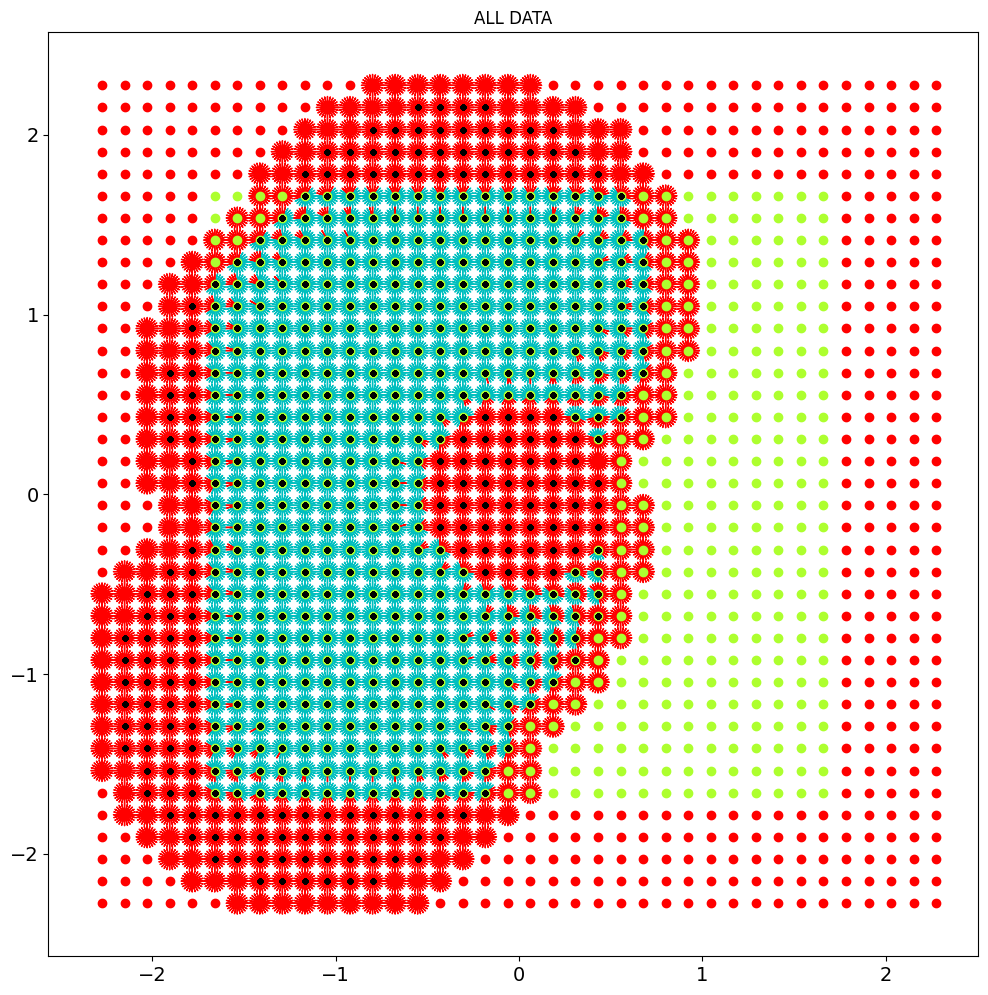

In [24]:
########################
### Safe Exploration ###
########################

a.pos = np.array([init_x, init_y, init_theta])

targets   = [np.array([1, -1,       0]),
             np.array([1, -1,       0]),
             np.array([1,  1, np.pi/2]),
             np.array([1,  1, np.pi/2])]
#targets   = None

for i in range(N):
    ######################
    ### Go to boundary ###
    ######################
    
    prev_pos = a.pos  
    if targets is not None:
        print("target:", targets[i]) 
        #traj,usig,total_slack = a.goto(targets[i], T=T, tend=tend, tol=htol, angle=a.pos[-1], manual=True, DT=DT, eps=eps)  
        traj,usig,total_slack = a.goto(target, T=T, tend=tend, tol=htol, angle=a.pos[-1], manual=True, DT=DT, eps=eps, N_part=60, 
                               plot_usig=True, plot_hxt=True)
        print("dx:", np.linalg.norm(a.pos - prev_pos))
    else: 
        while np.linalg.norm(a.pos - prev_pos) <= dx:    
            target_pos   = a.width*(1+unsafe_margin)*(np.random.rand(2)-0.5)  
            target_angle = np.array([2 * np.pi * np.random.rand()])
            target       = np.hstack((target_pos, target_angle)) 
            while h(target, np.array(a.centers), np.array(a.thetas))[0] > 0:
                target_pos   = a.width*(1+unsafe_margin)*(np.random.rand(2)-0.5)
                target_angle = np.array([2 * np.pi * np.random.rand()])
                target       =  np.hstack((target_pos, target_angle)) 
            print("target:", target) 
            traj,usig = a.goto(target, T=T, tend=tend, tol=tol, angle=a.pos[-1], manual=True, DT=DT, eps=eps) 
            print("dx:", np.linalg.norm(a.pos - prev_pos))

    ####################
    ### Collect data ###
    ####################

    # scan states 
    pts_safe, pts_unsafe, in_scan_f = a.scan(ret_in_scan_f=True)
    scan_funcs.append(in_scan_f)
    samples, gparams, is_obs_sample,\
    x2pi_samp, x0_samp = a.sample(rx, grid=s_grid, hjb_grid=hjb_grid, hjb=True, bicycle=True, boundary_condition=True)
    sample_funcs.append(is_obs_sample)
    loc_V, loc_hjb_grid    = a.get_local_V(gparams, obs_funcs + [is_obs_sample], thn, rx=rx, T=500, mult=mult)
    scan_safe, scan_unsafe,\
    x2pi_scan, x0_scan = a.scan_hjb(loc_V, loc_hjb_grid, bicycle=True, boundary_condition=True)
    n_safe             = len(scan_safe) #len(pts_safe)
    print("n safe", n_safe)
    print("scan safe shape", scan_safe.shape)
    x_buffer, x_safe   = a.make_buffer(scan_safe, int(nm * n_safe), pct, bicycle=True)

    x2pi = np.vstack((x2pi_samp, x2pi_scan))
    x0   = np.vstack((x0_samp, x0_scan))
    
    # unsafe states 
    if scan_unsafe.shape[0] != 0:
        x_unsafe = np.vstack((scan_unsafe, samples))
    else: 
        x_unsafe = samples    
        
    # centers
    C = []
    for x in c_grid:
        if np.linalg.norm(x[:2] - a.pos[:2]) <= rc:
            C.append(x)
    C = np.array(C)    
    tmp = []
    for p in C:
        c = np.repeat(p.reshape(1, -1), hjb_grid.states.shape[2], axis=0)
        c = np.hstack((c, np.array(hjb_grid.coordinate_vectors[2]).reshape(-1, 1)))
        cend = np.array([p[0], p[1], 2*np.pi]).astype(np.float32)
        tmp.append(np.vstack((c, cend)))
    C = np.vstack(tmp)  
    a.centers.append(C)

    # plot CBF data
    plot_angle_data(C, grid, obs_dict, spacing, safe=x_safe, buffer=x_buffer, unsafe=scan_unsafe, samples=samples)

    # safe and buffer control
    u_safe = hjb_controls_parallel(a, x_safe, loc_hjb_grid, loc_V, verbose=True)
    if x_buffer.shape[0] != 0:
        u_buffer = hjb_controls_parallel(a, x_buffer, loc_hjb_grid, loc_V)
    else:
        u_buffer = np.array([])

    # total data 
    from data import check_obs
    all_obs_func = lambda x: check_obs(x, obs_funcs) or (check_obs(x, sample_funcs) and not check_obs(x, scan_funcs))
    out_func     = lambda x: not ( check_obs(x, all_obs_func) or check_obs(x, scan_funcs) )
    obsamp_f     = lambda x: (check_obs(x, sample_funcs) or check_obs(x, obs_funcs)) and not (check_obs(x, scan_funcs) and not check_obs(x, obs_funcs))
    for x in grid:
        if obsamp_f(x):
            plt.plot(x[0], x[1], color='red', marker='o', linestyle='none')           
        else:
            plt.plot(x[0], x[1], color='black', marker='o', linestyle='none')
    plt.show()

    
    #####################
    ### Learn new CBF ###
    ##################### 
    interpv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
    b = interpv(loc_V, C)
    theta = fit_cbf_w_inv(a, C, b)
    eps=5e-3; tol=1e-4; 
    #theta, loss = gradient_descent(a, theta, it, eps, tol, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh)
    theta, loss, Lsafe, Ldyn, Lunsafe = gradient_descent(a, theta, it, eps, mu, tol, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe,\
                                    gamma_dyn, gamma_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh, lam_th, hm, use_jax=True)
    plt.plot(loss) 
    #theta = np.array(clarabel_solve_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe))#, x2pi=x2pi, x0=x0))
    a.thetas.append(theta)
    a.rectify_c_and_theta()

    # plot new CBF
    h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles)
    plot_angles(a, grid, hjb_grid, obs_dict)

    # collect quad plot data
    curr_data    = np.copy(np.vstack( ( curr_data, np.vstack((x_safe, x_buffer, x_unsafe)) ) ))
    curr_centers = np.copy(np.array(a.centers))
    curr_thetas  = np.copy(np.array(a.thetas))
    curr_traj    = np.copy(np.vstack( (curr_traj, traj) ))
    quad_plot_args[-1] = quad_plot_args[-1] + (curr_traj,)
    quad_plot_args.append((i+1, curr_centers, curr_thetas, curr_data))

    data_safe   = union(data_safe, np.vstack((x_buffer, x_safe)))
    data_unsafe = difference(union(data_unsafe, x_unsafe), data_safe)

    all_C = union(all_C, C)
    plot_angle_data(all_C, grid, obs_dict, spacing, safe=data_safe, unsafe=data_unsafe, title="ALL DATA")

final_pos = np.copy(a.pos)
quad_plot_args[-1] = quad_plot_args[-1] + (curr_traj,)

In [25]:
#vmin, vmax = loc_V.min(), loc_V.max()
#levels = np.linspace(round(vmin), round(vmax), 10*(round(vmax) - round(vmin) + 1))
X = np.linspace(lo[0], hi[0], n[0])
Y = np.linspace(lo[1], hi[1], n[1])
Th = np.linspace(0, 2*np.pi, thn, endpoint=True)
hvals = np.empty((n[0], n[1], thn))
h = get_h_curr(a)
pts = []
for i, x, in enumerate(X):
    for j, y in enumerate(Y):
        for k, th in enumerate(Th):
            pts.append(np.array([x, y, th]))
pts = np.array(pts)
hvals = h(pts)[0].reshape(n[0], n[1], thn)
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(vmax) - round(vmin) + 1))
fig    = plt.figure(figsize=(13, 8))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation

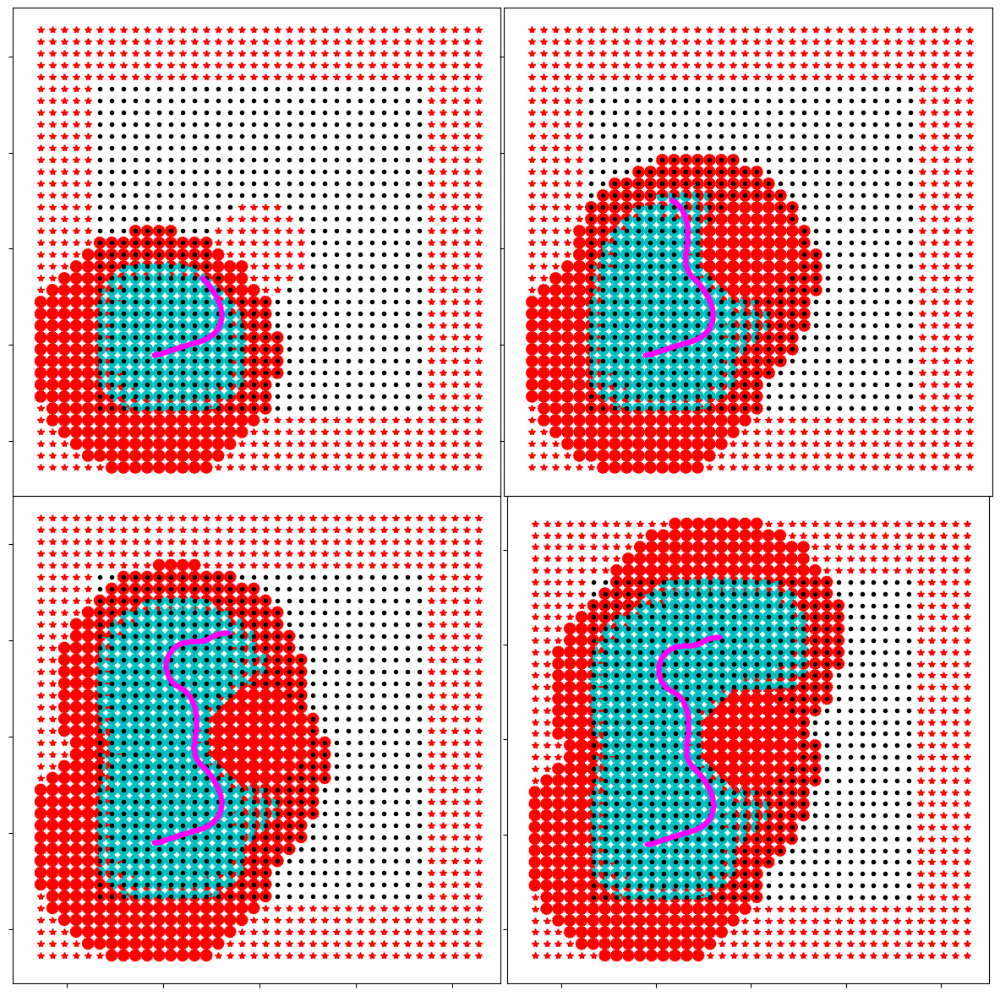

In [26]:
#######################################
### Sequential plot of learned CBFs ###
#######################################

fig = plt.figure(figsize=(15, 15))
axs = [fig.add_subplot(2,2,i+1) for i in range(4)]

for ax in axs:
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal') 
    
fig.subplots_adjust(wspace=0, hspace=0)

for i, args in enumerate(quad_plot_args):
    quad_plot(a, axs[i], args[0], args[1], args[2], args[3], args[4], grid, obs_dict)
plt.show()

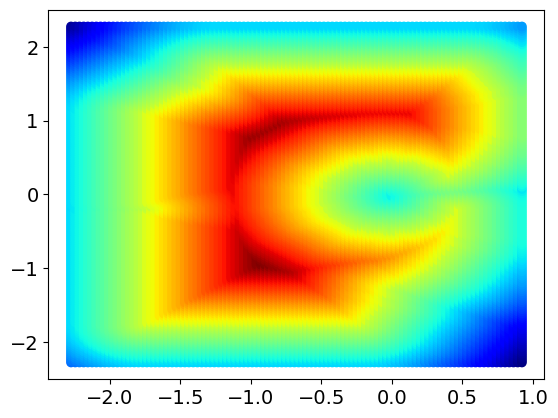

100%|#############################################################################################################################################| 500.0000/500.0 [01:48<00:00,  4.61sim_s/s]


number of gridpoints: (1181952,)
counts [26 20 19 ... 27 27 26]
pct 0.4
                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Aug 28 12:10:13 PM: Your problem has 6181 variables, 1 constraints, and 0 parameters.
(CVXPY) Aug 28 12:10:13 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Aug 28 12:10:13 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Aug 28 12:10:13 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Aug 28 12:10:13 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
------------------------------------------------------------------------------

TypeError: gradient_descent() missing 3 required positional arguments: 'lam_dh', 'lam_theta', and 'hmax'

<Figure size 640x480 with 0 Axes>

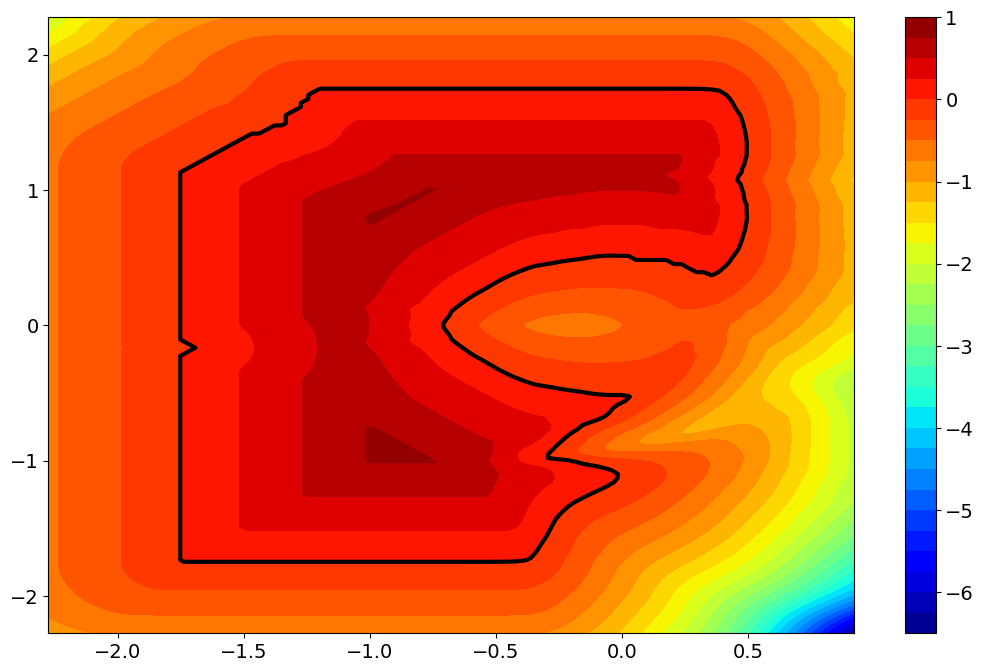

In [27]:
##################################################
### Learn a single CBF from all data collected ###
##################################################

n_safe = len(pts_safe)
all_obs_func = lambda x: (check_obs(x, sample_funcs) or check_obs(x, obs_funcs)) and not (check_obs(x, scan_funcs) and not check_obs(x, obs_funcs))
out_func     = lambda x: not ( check_obs(x, all_obs_func) or check_obs(x, scan_funcs) )
gparams = get_gparams(np.vstack((data_safe, data_unsafe)), hjb_grid)
loc_V, loc_hjb_grid = a.get_local_V(gparams, all_obs_func, thn, rx=None, out_func=out_func, T=500, mult=mult)
print("number of gridpoints:", loc_hjb_grid.states.flatten().shape)
all_x_buffer, all_x_safe = a.make_buffer(data_safe, int(nm * n_safe), pct, bicycle=True) 
all_u_safe = hjb_controls_parallel(a, all_x_safe, loc_hjb_grid, loc_V, verbose=True)
if x_buffer.shape[0] != 0:
    all_u_buffer = hjb_controls_parallel(a, all_x_buffer, loc_hjb_grid, loc_V)
else:
    all_u_buffer = np.array([])
interpv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
b = interpv(loc_V, C)
all_theta = fit_cbf_w_inv(a, C, b)
it = 3000; eps=1e-3; tol=1e-4; 
all_theta, loss = gradient_descent(a, all_theta, it, eps, tol, all_x_safe, all_u_safe, all_x_buffer, all_u_buffer, data_unsafe, gamma_safe, gamma_dyn, gamma_unsafe,\
                                   lam_safe, lam_dyn, lam_unsafe, lam_dh, centers=all_C)
plt.plot(loss)
#all_theta = np.array(clarabel_solve_cbf(a, all_x_safe, all_u_safe, all_x_buffer, all_u_buffer, data_unsafe, gamma_safe, gamma_dyn, gamma_unsafe, centers=all_C))
h_max = plot_cbf(a, np.array(all_C)[np.newaxis,...], np.array(all_theta)[np.newaxis,...], angle=a.pos[-1], obstacles=obstacles)
_plot_angles(a, np.array(all_C)[np.newaxis,...], np.array(all_theta)[np.newaxis,...], grid, hjb_grid, obs_dict)

In [ ]:
#############################
### Plot velocity curves ####
#############################
import copy

a2 = copy.copy(a)
a2.thetas = [all_theta]
a2.centers= [all_C]

start_pos = np.array([-1.2 ,-1, 0])
target    = np.array([1, 0, 0])
a.pos = start_pos
a2.pos= start_pos

DT   = 0.001
mpc_DT = 0.01
T    = 0.3
tol  = 0.05
tend = 30

traj ,usig = a.goto(target, T=T, tend=tend, tol=tol, angle=a.pos[-1], manual=True, DT=DT, mpc_DT=mpc_DT, eps=eps, bicycle=True)  
traj2,usig2= a2.goto(target, T=T, tend=tend, tol=tol, angle=a2.pos[-1], manual=True, DT=DT, mpc_DT=mpc_DT, eps=eps, bicycle=True) 


v1 = np.linalg.norm(np.vstack((traj[1:, :-1],np.array([0,0])))  - traj, axis=1)/DT
v2 = np.linalg.norm(np.vstack((traj2[1:,:-1],np.array([0,0])))  - traj2, axis=1)/DT
plt.plot(v1[:-1], color="red", label="max of local cbfs")
plt.plot(v2[:-1], color="blue", label="baseline")
plt.ylabel("velocity")
plt.xlabel("time")
plt.legend()
plt.show()

plt.plot(usig , color="red" , label="max cbf, |u|" )
plt.plot(usig2, color="blue", label="baseline, |u|")
plt.ylabel("norm of control")
plt.xlabel("time")
plt.legend()
plt.show()

In [ ]:
X = np.linspace(lo[0], hi[0], n[0])
Y = np.linspace(lo[1], hi[1], n[1])
Th = np.linspace(0, 2*np.pi, thn, endpoint=True)
hvals = np.empty((n[0], n[1], thn))
h = get_h_curr(a2)
for i, x, in enumerate(X):
    for j, y in enumerate(Y):
        for k, th in enumerate(Th):
            hvals[i, j, k] = h(jnp.array([x, y, th]))[0]
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(vmax) - round(vmin) + 1))
fig    = plt.figure(figsize=(13, 8))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation

In [ ]:
y =-0.66
Nx = 200
Nth = 200
X = np.linspace(-2, 2, Nx)
Theta = np.linspace(0-0.5, 2*np.pi+0.5, Nth)
xx, thth = np.meshgrid(X, Theta)
h = get_h_curr(a)
hvals = np.zeros((Nx, Nth))
for i, x in enumerate(X):
    for j, th in enumerate(Theta):
        hvals[i, j] = h(np.array([x, y, th]))[0]
fig = plt.figure(figsize=(14, 12))
from mpl_toolkits.mplot3d import Axes3D
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=60, azim=-30)
ax.plot_surface(xx, thth, hvals)
ax.set_xlabel("x", fontsize=20)
ax.set_ylabel("theta", fontsize=20)
ax.set_zlabel("h", fontsize=20)
ax.set_title("cbf for (x, y=" + str(np.round(y, 3)) + ", theta)", fontsize=20)
plt.show()

h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles, line=y)

In [ ]:
#########################################################
### Plot Dh(x)@(f(x)+g(x)u^*) + h(x) for CBF and CBVF ###
#########################################################
 
from controls import cbf_controls, cbf_controls_parallel
from optim import get_Dphi_curr
from tqdm import tqdm
N_part = 25
dynamics = a.dynamics
f = dynamics.open_loop_dynamics
g = dynamics.control_jacobian
fv = jax.vmap(f, in_axes=(0, None))
gv = jax.vmap(g, in_axes=(0, None))
mult=1
Nx = int(mult*loc_hjb_grid.states.shape[0])
Ny = int(mult*loc_hjb_grid.states.shape[1])
Nth = int(mult*thn)
#Nx = int(mult*n[0]); print("Nx", Nx)
#Ny = int(mult*n[1]); print("Ny", Ny)
#Nth= int(mult*thn); print("Nth", Nth)
for ftype in ["cbf"]:#, "hjb"]:
    X = np.linspace(loc_hjb_grid.domain.lo[0], loc_hjb_grid.domain.hi[0], Nx)
    Y = np.linspace(loc_hjb_grid.domain.lo[1], loc_hjb_grid.domain.hi[1], Ny)
    Th = np.linspace(0, 2*np.pi, Nth, endpoint=True)
    #X = np.linspace(lo[0], hi[0], Nx)
    #Y = np.linspace(lo[1], hi[1], Ny)
    #Th = np.linspace(0, 2*np.pi, Nth, endpoint=True)
    hvals = np.empty((Nx, Ny, Nth))
    onlyh = np.empty_like(hvals)
    if ftype == "cbf": 
        h = get_h_curr(a)
        Dphi = get_Dphi_curr(a)
    pts = []
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):  
                pts.append(np.array([x,y,th]))
    pts = np.array(pts) 
    print("#################")
    print("### PTS SHAPE ###:", pts.shape)
    print("#################")
    U = cbf_controls_parallel(a, pts, N_part=N_part, verbose=False)
    print("###############")
    print("### U SHAPE ###:", U.shape)
    print("###############")

    N = pts.shape[0]
    partition = int(N / N_part)
    remainder = N - (N_part * partition)
    dhX = None
    hmax = None
    for i in range(N_part + 1): 
        if i == N_part and remainder != 0:
            idx_start = i * partition
            idx_end = idx_start + remainder
        elif i == N_part and remainder == 0:
            break
        else:
            idx_start = i * partition
            idx_end = (i + 1) * partition
        P = pts[idx_start:idx_end]
        hmaxX, argmax = h(P)  
        thetas_max = np.array(a.thetas)[argmax,:]
        if dhX is None:
            dhX = np.einsum('ij,ijk->ik', thetas_max, Dphi(P))
            hmax = hmaxX
        else:
            dhX = np.vstack((dhX, np.einsum('ij,ijk->ik', thetas_max, Dphi(P))))
            hmax = np.concatenate((hmax, hmaxX))
        print("dhX shape", dhX.shape)
    dhX = dhX#.reshape(Nx, Ny, Nth, 3); print("dhX shape", dhX.shape)
    hmax = hmax#.reshape(Nx,Ny,Nth); print("hmax shape", hmax.shape)
    #onlyh = hmax  
    print("pts shape", pts.shape)
    fX = fv(pts,0)#.reshape(Nx,Ny,Nth,3); print("fX shape", fX.shape)
    gX = gv(pts,0)#.reshape(Nx,Ny,Nth,3); print("gX shape", gX.shape)
    l = 0
    grad = []
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):
                #p = np.array([x,y,th])
                if ftype == "cbf":
                    #u = cbf_controls(a, p) 
                    #hmax, argmax = h(p)
                    #hvals[i, j, k] = (a.thetas[argmax][np.newaxis,:] @ Dphi(p).squeeze() @ (f(p,0) + g(p,0) @ u) + hmax)[0]
                    grad.append(np.linalg.norm(dhX[l])**2)
                    #hvals[i,j,k] = (dhX[i,j,k][np.newaxis,...] @ (fX[i,j,k][...,np.newaxis] + gX[i,j,k][...,np.newaxis] @ U[l,:][...,np.newaxis]) + a.gamma*hmax[i,j,k]).item()
                    hvals[i,j,k] = (dhX[l][np.newaxis,...] @ (fX[l][...,np.newaxis] + gX[l] @ U[l,:][...,np.newaxis]) + (1/a.gamma)*hmax[l]).item()
                    #hvals[i, j, k] = (a.thetas[argmax] @ Dphi(p) @ (f(p,0) + g(p,0) @ U[l,:]) + a.gamma*hmax)[0]
                    onlyh[i,j,k] = hmax[l]
                    l += 1
grad = np.array(grad)
print("##################")
print("### ||grad||^2 ###:", np.max(grad))
print("##################")
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(hmax) - round(hmin) + 1))
fig    = plt.figure(figsize=(15, 15))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)
    plt.contour(X,
                Y,
                onlyh[:, :, i].T,
                levels=0,
                colors="cyan",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation

In [ ]:
#########################################################
### Plot Dh(x)@(f(x)+g(x)u^*) + h(x) for CBF and CBVF ###
#########################################################
 
from controls import cbf_controls, cbf_controls_parallel, hjb_controls_parallel_partitioned
from optim import get_Dphi_curr
from tqdm import tqdm
dynamics = a.dynamics
f = dynamics.open_loop_dynamics
g = dynamics.control_jacobian
mult=1
for ftype in ["cbvf"]:#, "hjb"]:
    X = np.linspace(loc_hjb_grid.domain.lo[0], loc_hjb_grid.domain.hi[0], int(mult*loc_hjb_grid.states.shape[0]))
    Y = np.linspace(loc_hjb_grid.domain.lo[1], loc_hjb_grid.domain.hi[1], int(mult*loc_hjb_grid.states.shape[1]))
    Th = np.linspace(0, 2*np.pi, int(mult*thn), endpoint=True)
    hvals = np.empty((int(mult*loc_hjb_grid.states.shape[0]), int(mult*loc_hjb_grid.states.shape[1]), int(mult*thn)))
    onlyh = np.empty_like(hvals)
    '''
    if ftype == "cbvf": 
        h = get_h_curr(a)
        Dphi = get_Dphi_curr(a)
    '''
    pts = []
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):  
                pts.append(np.array([x,y,th]))
    pts = np.array(pts) 
    print("#################")
    print("### PTS SHAPE ###:", pts.shape)
    print("#################")
    U = hjb_controls_parallel_partitioned(a, pts, loc_hjb_grid, loc_V, N_part=30, verbose=False)
    print("###############")
    print("### U SHAPE ###:", U.shape)
    print("###############")
    intv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
    hmax = intv(loc_V, pts)
    grad_h = intv(loc_hjb_grid.grad_values(loc_V), pts)
    l = 0
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):
                p = np.array([x,y,th])
                if ftype == "cbvf":
                    #u = cbf_controls(a, p) 
                    #hmax = loc_hjb_grid.interpolate(loc_V, p)
                    #hvals[i, j, k] = (a.thetas[argmax][np.newaxis,:] @ Dphi(p).squeeze() @ (f(p,0) + g(p,0) @ u) + hmax)[0]
                    hvals[i, j, k] = grad_h[l,:] @ (f(p,0) + g(p,0) @ U[l,:]) + (1/a.gamma)*hmax[l]
                    onlyh[i, j, k] = hmax[l]
                    l += 1
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(hmax) - round(hmin) + 1))
fig    = plt.figure(figsize=(15, 15))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)
    plt.contour(X,
                Y,
                onlyh[:, :, i].T,
                levels=0,
                colors="cyan",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation